<h2> <center> Introduction to Probabilistic Graphical Models </center>  </h2>

<h2> <center> Mini Project </center>  </h2>

## Contributor : Mohamed Rostom GHARBI

------------------------------------------------------------------------------------------------------------------

## Table of content :

[I. Theoretical part of the project](#theo) <br>
[1. Defining the problem](#defprob) <br>
[2. Probabilistic approach](#probap) <br>
[3. First step - Finding the hidden variable S](#1st-step) <br>
[4. Second step - Computing $P(S \vert V, W, H)$](#2nd-step) <br>
[5. Third step - Computing the E-step](#3rd-step) <br>
[6. Fourth step - Computing the M-step](#4th-step) <br>

[II. Practical part of the project](#prac) <br>
[Imports and intializations](#impor)<br>
[Visualizing the data set](#viz) <br>
[Implementing the Expectation Maximization algorithm](#impel) <br>
[Testing the EM algorithm](#test) <br> 
[Changing the EM's algorithm parameters](#chang) <br>

[Refrences](#ref)

------------------------------------------------------------------------------------------------------------------

<a id='theo'></a>
<center> <h2> <span style="color:blue"> Theoretical part of the project </span> </h2> </center>

## MAP estimation on NMF : 

<a id='defprob'></a>
### Defining the problem :

Consider the following probabilistic non-negative matrix factorization (NMF) model: (for f = 1, . . . , F , n = 1, . . . , N , k = 1, . . . , K)

$$ w_{f,k} \sim \mathcal{G}(w_{f,k},\alpha_w,\beta_w) $$

$$ h_{k,n} \sim \mathcal{G}(h_{k,n},\alpha_h,\beta_h) $$

$$ v_{f,n}\vert w_{f,:},h_{:,n} \sim \mathcal{PO}(v_{fn},\sum_{k=1}^K w_{f,k}h_{k,n}) $$

The following graph, shows the directed graphical model of this problem :

------------------------------------------------------------------------------------------------------------------

### Graphical model :

First of all, we will show our graphical model before introducing the hidden variable. 

<img src="graph1.png">

Now, after introducing the hidden variable 'S' that we have computed a litle bit [down](#s), we will show the new graphical model :

<img src="graph2.png">

The above graphical model in figure 2, will be so useful later to compute the joint probability $ P(S_{f,n}, v_{f,n},\theta_{f,n}) $.

------------------------------------------------------------------------------------------------------------------

<a id='probap'></a>
### Probabilistic approach :

We will now derive the Expecation-Maximization algorithm, to find the maximum a-posteriori estimate (MAP), defined as follow :

$$ (W^*,H^*) = \arg\max_{W,H}   \log p(W,H\vert V) $$

where V , W , and H are the matrices with the form: V = [ $v_{f,n}$ ], W = [ $w_{f,k}$ ] and H = [ $h_{k,n}$ ]

$$
\begin{equation} 
\boxed{ \underset{F\times N}{\mathrm{V}} =  \underset{F\times K}{W} \times 
\underset{K\times N}{H}}
\end{equation} 
$$

To solve this problem, and use the Expectation-Maximization algorithm following 4 important steps.

First of all, we will need to find the latent variable $ S $ such that $P(S\vert V,W,H)$ is computable. Then, during the second step, we will try and compute $P(S\vert V,W,H)$. In the third step, we will compute the E-step of the Expectation-Maximization algorithm, and we will compute the M-step.  </br>

------------------------------------------------------------------------------------------------------------------

<a id='s'></a>
<a id='1st-step'></a>
#### First step - Finding the hidden variable S: 

Let us consider, $$S_{f,n}=(s_{f,n,1},..,s_{f,n,K})$$ 

such that, $$s_{f,n,k}\vert w_{f,k},h_{k,n} \sim \mathcal{PO}(s_{f,n,k},w_{f,k}h_{k,n}) $$ 
and : 
$$v_{f,n}\vert S_{f,n} \sim \delta(v_{f,n}-\sum_{k=1}^Ks_{f,n,k}) $$ 

This supposition is made, by doing an analogy on what we had in class during the last course. 
 
Let us consider $ \theta $ = {W,H}, during the next step, we will try to compute $P(S\vert V,W,H) = P(S\vert V, \theta)$

------------------------------------------------------------------------------------------------------------------

<a id='2nd-step'></a>
#### Second step - Computing $P(S \vert V, W, H)$  : 

For this matter, we have, $$ P(S\vert V,W,H) = P(S\vert V, \theta) = \prod_{f=1}^F\prod_{n=1}^N P(S_{f,n}\vert v_{f,n},w_{f,:}h_{:,n}) = \prod_{f=1}^F\prod_{n=1}^N P(S_{f,n}\vert v_{f,n}, \theta_{f,n})  $$ with, $$\theta_{f,n} = w_{f,:}h_{:,n} $$

Now, we will need the bayes rule to write the following : 

$$
\begin{equation} 
\boxed{P(S_{f,n}\vert v_{f,n},\theta_{f,n})=\frac{P(S_{f,n},v_{f,n},\theta_{f,n})}{P(v_{f,n},\theta_{f,n})}}
\end{equation} 
$$


Let's call this equation number 1, we will get back to this equation after solving both it's parts. 

Let's start of with it's numerator, for this matter we just need to have a look at our graphical model. We simply get, 

$$ P(S_{f,n}, v_{f,n},w_{f,:}h_{:,n}) = P(w_{f,:}h_{:,n})P(S_{f,n}\vert w_{f,:}h_{:,n})P(v_{f,n} \vert S_{f,n},w_{f,:}h_{:,n})$$

which is the same as,

$$ P(S_{f,n}, v_{f,n},\theta_{f,n}) = P(\theta_{f,n})P(S_{f,n}\vert \theta_{f,n})P(v_{f,n} \vert S_{f,n},\theta_{f,n})$$

Now, we get back at expression number one, and we replace the numerator by this new expression we got above, we get :

$$ P(S_{f,n} \vert v_{f,n} \theta_{f,n}) = \frac{P(\theta_{f,n})P(S_{f,n}\vert \theta_{f,n})P(v_{f,n} \vert S_{f,n})}{P(v_{f,n},\theta_{f,n})} $$

<=> we use bayes rule again, $$ P(S_{f,n} \vert v_{f,n},\theta_{f,n}) = \frac{P(\theta_{f,n})P(S_{f,n}\vert \theta_{f,n})P(v_{f,n} \vert S_{f,n})}{P(\theta_{f,n})P(v_{f,n} \vert \theta_{f,n}) } $$

<=> Then we simply simplify by $P(\theta_{f,n})$ and we get,

$$
\begin{equation} 
\boxed{P(S_{f,n} \vert v_{f,n},\theta_{f,n}) = \frac{P(S_{f,n}\vert \theta_{f,n})P(v_{f,n} \vert S_{f,n})}{P(v_{f,n} \vert \theta_{f,n})}}
\end{equation} 
$$

Let's call this expression number 2, we can see that there is 3 terms in this expression, we will try to compute them one by one.


- We start by the first term and we try to compute, <span style="background-color: #FFFF00">$P(S_{f,n}\vert \theta_{f,n})$</span>, we get

$$ P(S_{f,n}\vert \theta_{f,n}) = P(S_{f,n,1},S_{f,n,2}, ..., S_{f,n,K}\vert \theta_{f,n}) $$

<=> We replace $\theta_{f,n}$ with it's original expression and we get,  $$  P(S_{f,n}\vert w_{f,:},h_{:,n}) = \prod_{k=1}^K P(s_{f,n,k}\vert w_{f,k},h_{k,n}) $$

On the other hand, we know that, 

$$s_{f,n,k}\vert w_{f,k},h_{k,n} \sim \mathcal{PO}(s_{f,n,k},w_{f,k}h_{k,n}) $$ 

<div class="alert alert-info" role="alert">

<h4> Reminder :</h4>

if $$X \sim \mathcal{PO}(x,\lambda) $$  

We have, 

$$
\begin{equation} 
\boxed{P\left( x \right) = \frac{{e^{ - \lambda } \lambda ^x }}{{x!}}}
\end{equation} 
$$

</div>

And thus, we get, 

$$ P(s_{f,n,k}\vert w_{f,k},h_{k,n})  = \frac{(w_{f,k}h_{k,n})^{s_{fnk}}}{s_{fnk}!} \exp{(-w_{f,k}h_{k,n})} $$

and so,

$$
\begin{equation} 
\boxed{P(S_{f,n}\vert w_{f,:},h_{:,n}) = \prod_{k=1}^K \frac{(w_{f,k}h_{k,n})^{s_{fnk}}}{s_{fnk}!} \exp{(-w_{f,k}h_{k,n})}}
\end{equation} 
$$


- Now we will compute the second expression of equation number 2, <span style="background-color: #FFFF00">$P(v_{f,n} \vert S_{f,n})$ </span> :

We know that, 
$$v_{f,n}\vert S_{f,n} \sim \delta(v_{f,n}-\sum_{k=1}^Ks_{f,n,k}) $$ 

and thus, it's easy to compute it's expression.

$$
\begin{equation} 
\boxed{P(v_{f,n} \vert S_{f,n}) = \left\{
                \begin{array}{ll}
\textbf{0 if      } v_{f,n} \ne \sum_{k=1}^{K} s_{f,n,k} \\ 
\textbf{1 if    not}
                \end{array}
              \right.}
\end{equation} 
$$

* And finaly, we compute the last term of equation number 2, <span style="background-color: #FFFF00">$P(v_{f,n} \vert \theta_{f,n}) = P(v_{f,n} \vert w_{f,:},h_{:,n})$ </span>   : 

We know that, $$ v_{fn}\vert w_{f,:},h_{:,n} \sim \mathcal{PO}(v_{fn},\sum_{k=1}^K w_{f,k}h_{k,n}) $$

As we did with the first term of equation number 2, we get :

$$P(v_{f,n}\vert w_{f,:}h_{:,n}) = \frac{(\sum_{k=1}^Kw_{f,k}h_{k,n})^{v_{f,n}}}{(v_{f,n})!} \exp{(-\sum_{k=1}^Kw_{f,k}h_{k,n})}$$ 

Let's now do the same thing we did in class, and note, <span style="background-color: #FFFF00">$\ \hat{v}_{f,n}=\sum_{k=1}^Kw_{f,k}h_{k,n}$</span> , we get :


$$
\begin{equation} 
\boxed{P(v_{f,n}\vert w_{f,:}h_{:,n}) = \frac{(\hat{v}_{f,n})^{v_{f,n}}}{(v_{f,n})!} \exp{(-\hat{v}_{f,n})}}
\end{equation} 
$$


Finaly, we get the whole expression of $P(S_{f,n}, v_{f,n},\theta_{f,n})$ :

$$
\begin{equation} 
\boxed{P(S_{f,n} \vert v_{f,n}, \theta_{f,n}) = P(S_{f,n} \vert v_{f,n}, w_{f,:}, h_{:,n}) = \frac{P(S_{f,n}\vert \theta_{f,n})P(v_{f,n} \vert S_{f,n})}{P(v_{f,n} \vert \theta_{f,n})} = \frac{v_{f,n}!}{\prod_{k=1}^K s_{f,n,k}!}\prod_{k=1}^K(\frac{w_{f,k}h_{k,n}}{\hat{v}_{f,n}})^{s_{f,n,k}}}
\end{equation} 
$$

When we look at the expression above, we notice that we can write it in such a way, to get the probabilistic law of it : 

We get,

$$P(S_{f,n} \vert v_{f,n}, \theta_{f,n}) = P(S_{f,n} \vert v_{f,n}, w_{f,:}, h_{:,n}) =  \frac{v_{f,n}!}{\prod_{k=1}^K s_{f,n,k}!}\prod_{k=1}^K(\frac{w_{f,k}h_{k,n}}{\hat{v}_{f,n}})^{s_{f,n,k}}$$



$$
\begin{equation} 
\boxed{P(S_{f,n} \vert v_{f,n}, \theta_{f,n}) = P(S_{f,n} \vert v_{f,n}, w_{f,:}, h_{:,n}) = \frac{v_{f,n}!}{s_{f,n,1}!, s_{f,n,2}!, s_{f,n,3}! ..., s_{f,n,K}!} \prod_{k=1}^K[\frac{w_{f,k} h_{k,n}}{\hat{v}_{f,n}}]^{s_{f,n,k}}}
\end{equation} 
$$


<div class="alert alert-info" role="alert">

<h4> Reminder : </h4>

Let $$X \sim \mathcal{Multinomial}{(n, p1, ..., p_{K})}$$

We have then,

$$
\begin{equation} 
\boxed{P(X) = \frac{n!}{x_{1}! x_{2}! x_{3}! ... x_{K}!} p_1^{x_1} p_2^{x_2} p_3^{x_3} ... p_K^{x_K}}
\end{equation} 
$$

</div>

We can concluse from the last reminder, that $P(S_{f,n} \vert v_{f,n}, \theta_{f,n})$ follows a Multinomial distribution, we will try now to identify the Multinomial probability law's parameters.

- n is replaced by $v_{f,n}$.
- $p_k$ is replaced by $\frac{w_{f,k}h_{k,n}}{\hat{v}_{fn}}$, $\forall i \in [1 .. K]$ 

-> We conclude that, $$S_{fn}\vert v_{f,n},w_{f,:}h_{:,n} \sim \mathcal{M}(v_{f,n},p_1,p_2,..,p_k)$$

with $p_k = \frac{w_{f,k}h_{k,n}}{\hat{v}_{fn}} = \frac{w_{f,k}h_{k,n}}{\sum_{i=1}^K w_{f,i}h_{i,n}} $, $\forall i \in [1 .. K]$ 

Now, we need to go all the way back, and try to compute $ P(S \vert V, W, H) = P(S \vert V, \theta)$ with $\theta =  W , H$.

We get,

\begin{align}
P(S\vert V,W,H) &= \prod_{f=1}^F \prod_{n=1}^N P(S_{f,n}\vert v_{f,n},w_{f,:}h_{:,n})\\
 &= \prod_{f=1}^F\prod_{n=1}^N  \frac{v_{f,n}!}{\prod_{k=1}^K s_{f,n,k}!}\prod_{k=1}^K[\frac{w_{f,k}h_{k,n}}{\hat{v}_{f,n}}]^{s_{f,n,k}} \\
\end{align}



$$
\begin{equation} 
\boxed{P(S\vert V,W,H) = P(S \vert V, \theta) = \prod_{f=1}^F\prod_{n=1}^N  \frac{v_{f,n}!}{\prod_{k=1}^K s_{f,n,k}!}\prod_{k=1}^K[\frac{w_{f,k}h_{k,n}}{\hat{v}_{f,n}}]^{s_{f,n,k}} }
\end{equation} 
$$

-> We stick to this expression and we will move on to the third step, which is computing the E-step.

------------------------------------------------------------------------------------------

<a id='3rd-step'></a>
#### Third step - Computing the E-step :

As explained in during the problem introduction, we will now compute the E-step. 

We know that, 

$$
\begin{equation} 
\boxed{\mathcal{L}_t(W,H)=\mathbf{E}(\log(P(S,V,W,H))_{P(S|V,W^t,H^t)}}
\end{equation} 
$$

We will try to compute it,

\begin{align*}
\mathcal{L}_t(W,H) =&\mathbf{E}(\log(P(S,V,W,H))_{P(S|V,W^t,H^t)} \\
   =&   \mathbf{E}(\log(P(W,H)+\log(P(S|W,H)+log(P(V|S) )_{P(S|V,W^t,H^t)}\\
   =&^+ \mathbf{E}(\log(P(W,H)) + \log(P(S|W,H) )_{P(S|V,W^t,H^t)} \\
\end{align*}

We removed log(P(V|S) since it is independent of $\theta = W , H$.

We see here that we have got two terms to compute.

- <span style="background-color: #FFFF00">Computing $P(W,H)$ </span> : 

Since, W and H are independant, we have, 

$$ P(W,H) = P(W) P(H) $$

and so,

$$
\begin{equation} 
\boxed{ \log(P(W,H)) = \log(W) + \log(H)  }
\end{equation} 
$$


    - Computing log(P(W)) : 
    
         We know that,
$$ w_{fk} \sim \mathcal{G}(w_{fk},\alpha_w,\beta_w) $$

\begin{align*}
\log P(W)=&\sum_{f=1}^F\sum_{k=1}^K log(P(w_{f,k})) \\
=& \sum_{f=1}^F\sum_{k=1}^K (\alpha_w-1)\log(w_{f,k})+\alpha_w \log(\beta_w) -\beta_w w_{f,k} \\
=&^+ \sum_{f=1}^F\sum_{k=1}^K (\alpha_w-1)\log(w_{f,k})-\beta_w w_{f,k}
\end{align*}

        We finaly get,
        
$$
\begin{equation} 
\boxed{\log(P(W)) =^+ \sum_{f=1}^F\sum_{k=1}^K (\alpha_w-1)\log(w_{f,k})-\beta_w w_{f,k}}
\end{equation} 
$$


------------------------------------------------------------------------------

    - Computing log(P(H)) :
    
    We know that, 
    
$$ h_{k,n} \sim \mathcal{G}(h_{k,n},\alpha_h,\beta_h) $$
    
    And so, we just compute Log(P(H)), 
    
\begin{align*}
\log P(H)=&\sum_{n=1}^N\sum_{k=1}^K log(P(h_{k,n})) \\
=&\sum_{n=1}^N\sum_{k=1}^K (\alpha_h-1)\log(h_{k,n})+\alpha_h \log(\beta_h)-\beta_h h_{k,n} \\
=&^+ \sum_{n=1}^N\sum_{k=1}^K (\alpha_h-1)\log(h_{k,n})-\beta_h h_{k,n}
\end{align*}
     
     And so we have, 

$$
\begin{equation} 
\boxed{\log(P(H)) =^+ \sum_{n=1}^N\sum_{k=1}^K (\alpha_h-1)\log(h_{k,n})-\beta_h h_{k,n}}
\end{equation} 
$$

     
        

- <span style="background-color: #FFFF00">Computing $P(S \vert W,H)$ </span> : 

\begin{align*}
\log( P(S|W,H) ) &= \log(\prod_{f=1}^F \prod_{n=1}^N  P(s_{f,n}|w_{f,:}h_{:,n})) \\ &=\sum_{f=1}^{F}\sum_{n=1}^N\log(P(s_{f,n}|w_{f,:}h_{:,n})) \\
&=\sum_{f=1}^{F}\sum_{n=1}^N\sum_{k=1}^K\log(P(s_{f,n,k}|w_{f,k}h_{k,n})) \\  
&= \sum_{f=1}^{F}\sum_{n=1}^N\sum_{k=1}^K\log(\frac{(w_{f,k}h_{k,n})^{s_{f,n,k}}}{s_{f,n,k}!}\exp{(-w_{f,k}h_{k,n})}) \\
&= \sum_{f=1}^{F}\sum_{n=1}^N\sum_{k=1}^K s_{f,n,k}\log(w_{f,k}h_{k,n})-\log(s_{f,n,k}!)-w_{f,k}h_{k,n}\\
&=^+ \sum_{f=1}^{F}\sum_{n=1}^N\sum_{k=1}^K s_{f,n,k}\log(w_{f,k}h_{k,n})-w_{f,k}h_{k,n}
\end{align*}

$\log(s_{f,n,k}!)$ is removed since it is independant from W and H.

We finaly get, 

$$
\begin{equation} 
\boxed{\log( P(S|W,H) ) =^+ \sum_{f=1}^{F}\sum_{n=1}^N\sum_{k=1}^K s_{f,n,k}\log(w_{f,k}h_{k,n})-w_{f,k}h_{k,n}}
\end{equation} 
$$


Now, we go back at our original E-step expression and try to compute the mean,

\begin{align*}
\mathcal{L}_t(W,H) =&\mathbf{E}(\log(P(S,V,W,H))_{P(S|V,W^t,H^t)} \\
=&  \mathbf{E}(\log(P(W,H)+\log(P(S|W,H)+log(P(V|S) )_{P(S|V,W^t,H^t)}\\
=&^+ \mathbf{E}(\log(P(W,H)) + \log(P(S|W,H) )_{P(S|V,W^t,H^t)} \\
&= \sum_{f=1}^{F}\sum_{n=1}^N\sum_{k=1}^K ( \mathbf{E}(s_{f,n,k})_{P(s_{f,n,k}|v_{f,n},w_{f,k}^th_{k,n}^t)}\log(w_{f,k}h_{k,n})-w_{f,k}h_{k,n}) \\& +\sum_{f=1}^F\sum_{k=1}^K (\alpha_w-1) \log(w_{f,k})-\beta_w w_{f,k} + \sum_{n=1}^N\sum_{k=1}^K (\alpha_h-1)\log(h_{k,n})-\beta_h h_{k,n} \\
\end{align*}



We will need now to compute $\mathbb{E}(s_{f,n,k})_{P(s_{f,n,k}|v_{f,n})}$ :

<div class="alert alert-info" role="alert">

<h4> Reminder : </h4>

Let $$X \sim \mathcal{Multinomial}{(n, p_{1}, ..., p_{K})}$$

We have then,

$$
\begin{equation} 
\boxed{
\begin{align*}
\mathbf{E}(x_{i}) &= n.pi
\end{align*}
}
\end{equation} 
$$

</div>

And so, we conclude that, 

$$
\begin{equation} 
\boxed{
\begin{align*}
\mathbf{E}(s_{f,n,k})_{P(s_{f,n,k}|v_{f,n})}  &= v_{f,n} \frac{w_{f,k}^th_{k,n}^t}{\hat{v}_{f,n}^t} 
\end{align*}
}
\end{equation}             
$$          

We just replace this term, in E-step expression, and we get as final result :

$$
\begin{equation} 
\boxed{
\begin{align*}
\mathcal{L}_t(W,H) &= \sum_{f=1}^{F}\sum_{n=1}^N\sum_{k=1}^K (v_{f,n} \frac{w_{f,k}^th_{k,n}^t}{\hat{v}_{f,n}^t}\log(w_{f,k}h_{k,n})-w_{f,k}h_{k,n}) \\ &+\sum_{f=1}^F\sum_{k=1}^K (\alpha_w-1) \log(w_{f,k})-\beta_w w_{f,k} + \sum_{n=1}^N\sum_{k=1}^K (\alpha_h-1)\log(h_{k,n})-\beta_h h_{k,n} 
\end{align*}
}
\end{equation} 
$$

------------------------------------------------------------------------------------------

<a id='4th-step'></a>
#### Fourth step - Computing the M-step : 

Now, we get to the final step, which is computing the M-step.

The M-step consists in finding W and H, such that :

$$ W^{t+1}, H^{t+1}=\arg\max_{W,H} \mathcal{L}_t(W^{t},H^{t}) $$

This problem, can be divided as follows : 

1- We need to find H, such that, 
$$ H^{t+1}=\arg\max_{W} \mathcal{L}_t(W^t,H) $$

2- We need to find W, such that, 
$$ W^{t+1}=\arg\max_{W} \mathcal{L}_t(W,H^t) $$


- Finding $H^{t+1}$: 
    
    To find it, we need to derive the expression of $\mathcal{L}_t(W,H)$ with respect to H, we obtain : 

$$ \nabla_H \mathcal{L}_t(W^t,H) = (\frac{\partial}{\partial{h_{k,n}}}\mathcal{L}_t(W^t,H))_{1 \leq k\leq K,1 \leq n\leq N} $$


$$ \frac{\partial}{\partial{h_{k,n}}}\mathcal{L}_t(W^t,H)) = \sum_{f=1}^F ((\frac{w_{f,k}}{w_{f,k}h_{k,n}^{t+1}})(\frac{w_{f,k}^t h_{k,n}^t}{\hat{v}_{f,n}^t}v_{f,n} - w_{f,k}) + (\alpha_h - 1)\frac{1}{h_{k,n}} - \beta_h = 0 $$

$$
\begin{equation} 
\boxed{h_{k,n}^{t+1} = \frac{(\alpha_h-1)+\sum_f (v_{f,n}{\frac{w_{f,k}^th_{k,n}^t}{\hat{v}_{f,n}^t}})}{\beta_h+\sum_f w_{f,k}^t}}
\end{equation} 
$$
    
- Finding $W^{t+1}$:
    Same as H, we need to derive the expression of $\mathcal{L}_t(W,H)$ with respect to W, and we get :
    
$$ \nabla_W \mathcal{L}_t(W,H^t) = (\frac{\partial}{\partial{w_{f,k}}}\mathcal{L}_t(W,H^t))_{1 \leq f\leq F,1 \leq k\leq K} $$

$$ \frac{\partial}{\partial{w_{f,k}}}\mathcal{L}_t(W,H^t)_{ \vert w_{f,k} = w_{f,k}^{t+1} } = \sum_{n=1}^N (v_{f,n} \frac{w_{f,k}^th_{k,n}^t}{\hat{v}_{f,n}^t}\frac{1}{w_{f,k}^{t+1}})-h_{k,n}) + \frac{(\alpha_w-1)}{w_{f,k}^{t+1}}-\beta_w = 0 $$


$$[(\alpha_w-1)+\sum_n (v_{fn}{\frac{w_{fk}^th_{kn}^t}{\hat{v}_{fn}^t}})]\frac{1}{w_{fk}^{t+1}}= \beta_w+\sum_k h_{kn}^t$$

$$
\begin{equation} 
\boxed{w_{fk}^{t+1} = \frac{(\alpha_w-1)+\sum_n (v_{fn}{\frac{w_{fk}^th_{kn}^t}{\hat{v}_{fn}^t}})}{\beta_w+\sum_k h_{kn}^t}
}
\end{equation} 
$$

------------------------------------------------------------------------------------------

<a id='prac'></a>
<center> <h2> <span style="color:blue"> Practical part of the project </span> </h2> </center>

In this part, our aim will be to analyze a dataset of face images. We will use the AT&T Database of Faces. This
dataset contains face images from 40 distinct subjects, where there are 10 images for each subject. In total there are 400 images in the dataset, where the size of each image is 92 x 112 pixels, with 256 gray levels per pixel.

A preview image of this dataset will be shown in "Visualizing the data set" part.

In this experiment, we will ‘vectorize’ all the images in the dataset and concatenate these vectors in order to
represent the whole dataset as a matrix. Finally, we obtain an observed matrix V of dimensions F = 92 × 112 and
N = 400. The matrix V obtained from the dataset is in the file “attfaces.mat”.

The goal of the experiment is to obtain a ‘parts-based-representation’ of faces by learning an NMF model on this
dataset. Our hope is that, when we estimate the matrices W and H by using V , the columns of W will correspond
to some images that only contain a particular part of a face (remember that each column of W is a vector of size
F = 92 × 112. Therefore we can reshape this vector to obtain an image (matrix) of size 92 × 112.).

------------------------------------------------------------------------------------------

<a id='impor'></a>
### Different imports and initializations : 

Different imports that will be needed during this project. 

In [1]:
import scipy.io
import matplotlib.pyplot as plt
import scipy.stats as stats 
from math import *
import numpy as np
%matplotlib inline

In [2]:
from IPython.core.display import HTML
HTML("""
<style>
.output_png {
    display: table-cell;
    text-align: center;
    vertical-align: middle;
}
</style>
""")

In [3]:
all_data = scipy.io.loadmat('attfaces.mat')

In [4]:
data = all_data['V']

------------------------------------------------------------------------------------------

<a id='viz'></a>
### Visualizing the data set :

To be able to have a preview on those images, we will define a function called **visualize_faces** that will be very useful for us for the next vizualisations : 

In [5]:
def visualize_faces(data, numVisualize=400, height=112, width=92):

    V_visual = np.zeros( ( height * int(sqrt(numVisualize)) , width * int(sqrt(numVisualize)) ) )
    k = 0
    ix = 0 #This value is used to translate over the X axe.
    for i in range(int(sqrt(numVisualize))) :
        iy = 0 #This value is used to translate over the Y axe.
        for j in range(int(sqrt(numVisualize))) :
            curV = data[:,k] #We get images one by one, since they are stored as a column in matrix V ( data in this case).
            curV = np.reshape(curV, (width, height)) #After getting the image, we use reshape to display the image as it is.
            V_visual[ix : (ix + height ) , iy : (iy + width )] = curV.T #We put every image one by one, and then translate over both the axes.
            iy += width
            k +=1
        ix += height
    return V_visual

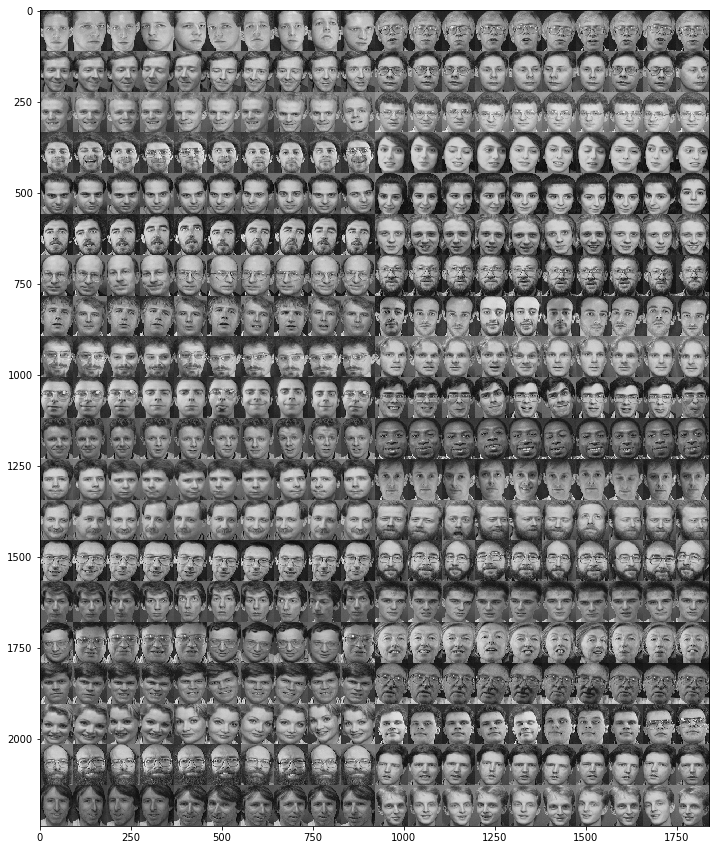

In [6]:
plt.figure(figsize=(15,15))
plt.imshow(visualize_faces(data), cmap=plt.cm.gray, interpolation="nearest")

We will also define a function, that makes it possible to plot the different subjects : <br>

** Reminder : This
dataset contains face images from 40 distinct subjects, where there are 10 images for each subject. **

In [7]:
def plot_subject(images, subject=0, cmap='gray'):
    subject -=1
    fig, ax = plt.subplots(1, 10, figsize=(20, 20))
    print("Images of subject : %d" %(subject+1))
    for index, i in enumerate(range(subject*10, 10*(subject+1))):
        ax[index].imshow(images[i], cmap=cmap)
        
def images_vector_to_matrix(V):
    imgs_matrix=[]
    for i in range(V.shape[1]):
        imgs_matrix.append(np.reshape(V[:, i], (92, 112)).T)
    return np.array(imgs_matrix)

In [8]:
images = images_vector_to_matrix(data)
images.shape

(400, 112, 92)

We clearly see that we have 400 images, each 92 x 112. 

We will try now to plot the different images per subject, since we have 40 subjects, we will just plot the 10 images of the first 5 subjects. 

Images of subject : 1


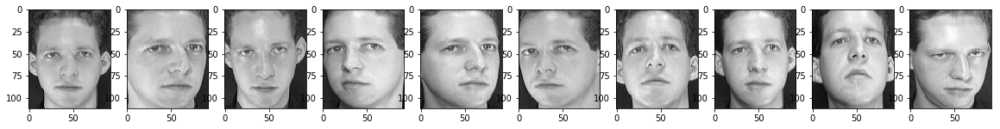

In [9]:
plot_subject(images, subject=1)

Images of subject : 2


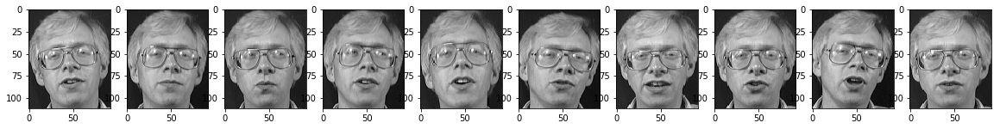

In [10]:
plot_subject(images, subject=2)

Images of subject : 3


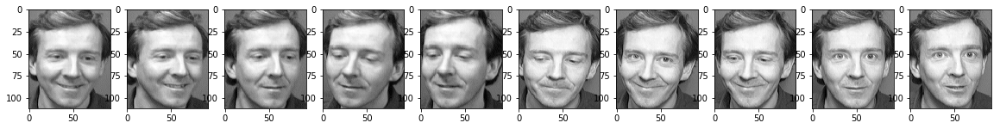

In [11]:
plot_subject(images, subject=3)

Images of subject : 4


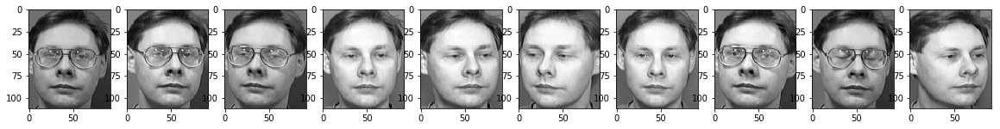

In [12]:
plot_subject(images, subject=4)

Images of subject : 5


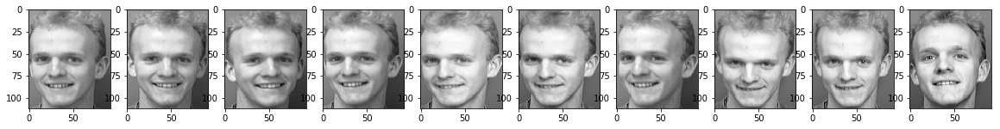

In [13]:
plot_subject(images, subject=5)

We can see above, that we have 10 images of 5 different subjects. 

------------------------------------------------------------------------------------------

<a id='impel'></a>
### Implemeting the expectation maximization algorithm :

We will now implement the EM algorithm that I developed in question 1 ( Theoritical part of the project ) : 

In [14]:
def EM_algoritm(V, beta_w=1, beta_h=1, n_iter=1, K=25, alpha_w=1, alpha_h=1):

    # Different initialisations
    F = V.shape[0]
    N = V.shape[1]
    
    #We know the distributions of W and H, which is a Gamma distribution :
    W = np.random.gamma(alpha_w, 1./beta_w, (F, K))
    H = np.random.gamma(alpha_h, 1./beta_h, (K, N))
    
    #np.ones_like : Returns an array of ones with the same shape and type as a given array.
    ones_V = np.ones_like(V)
    ones_H = np.ones_like(H)
    ones_W = np.ones_like(W)
    
    for t in range(n_iter):
        V_hat = W.dot(H) #At first we compute V_hat, we will need it to compute both W and H..
        
        #Computing W with respect to the expressions we've got in the theoritical part of the project.
        num_W = (alpha_w - 1) * ones_W + W * ((V / V_hat).dot(H.T))
        denum_W = beta_w * ones_W + ones_V.dot(H.T)
        W_new = num_W/denum_W
        
        #Computing H with respect to the expressions we've got in the theoritical part of the project.
        num_H = (alpha_h - 1) * ones_H + H * ((W.T).dot(V / V_hat))
        denum_H = beta_h * ones_H + (W.T).dot(ones_V)
        H = num_H/denum_H
        
        #We update the value of W, since it will be used later on to compute W again.
        W = W_new
        
    return W, H

------------------------------------------------------------------------------------------

<a id='test'></a>
### Testing the EM algorithm : 

We will just now try our algorithm with fixed parameters values, then, during the next step, we will try to change the differents values of $\beta$ and then $\alpha$ , and then observe the different results when we do so. 

###  No change in the parameters values :  $\ K = 25 ;\alpha_w = \alpha_h =1\ ;\ \beta_h = \beta_w =1\ $



In [15]:
W_EM, H_EM = EM_algoritm(data, beta_w=1, beta_h=1, n_iter=100, K=25, alpha_w=1, alpha_h=1)

Now, after having the W and H resulted from the EM algorithm, We will try to compute V, and see the difference we got between the real image, and the estimated one for the first five subjects.

In [16]:
#Different intializations :
V_EM = W_EM.dot(H_EM)
images_EM = images_vector_to_matrix(V_EM)

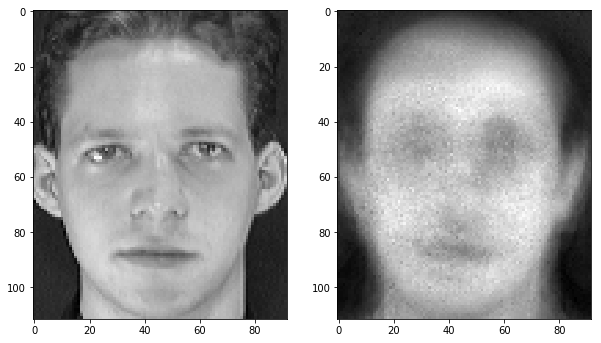

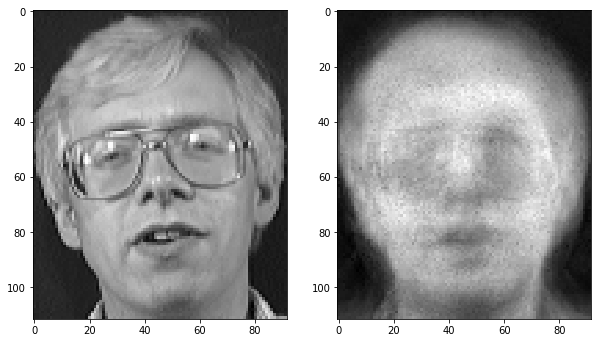

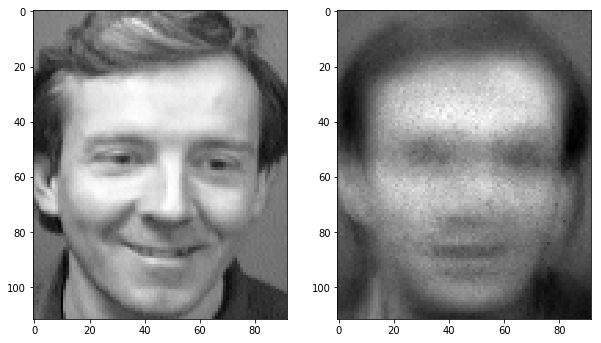

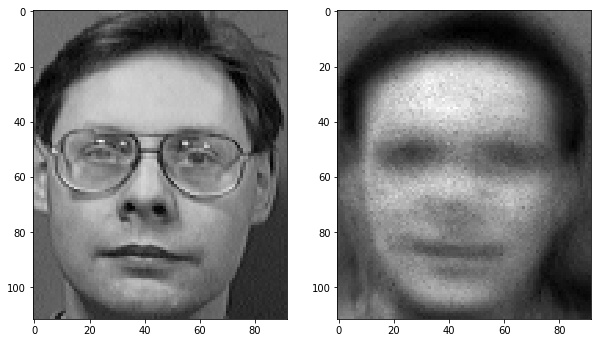

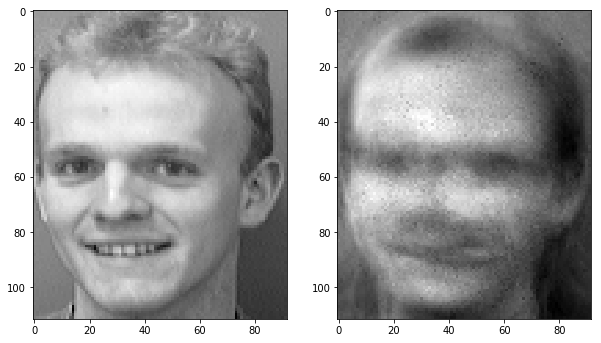

In [17]:
for i in range(5):
    fig, axes = plt.subplots(1, 2, figsize=(10, 10))
    axes[0].imshow(images[i*10], cmap='gray')
    axes[1].imshow(images_EM[i*10], cmap='gray')

We will now try to vizualise the different features we are getting from W.

We know that,  $$\underset{F\times N}{\mathrm{V}} =  \underset{F\times K}{W} \times 
\underset{K\times N}{H}$$

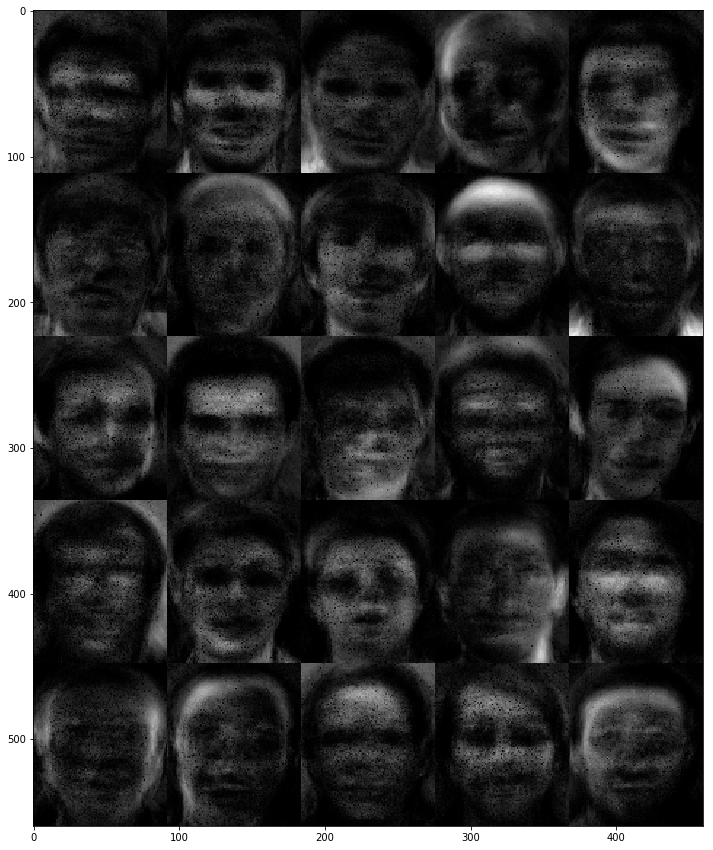

In [18]:
plt.figure(figsize=(15,15))
plt.imshow(visualize_faces(W_EM, numVisualize=W_EM.shape[1]), cmap=plt.cm.gray, interpolation="nearest")

We clearly see that there is a big difference between the images. On the other hand, when we look closely, we can notice that there are certain face features missing for some of the pictures. 

------------------------------------------------------------------------------------------

<a id='chang'></a>
### Changing Expectation Maximization algorithm's parameters : 

For this, we will define a function called **Params_change**. <br>
This function will help us answer questions 2.2, 2.3 and 2.4 of the project.
At each step, we will change wether $\beta$, $\alpha$ or the number of components K, and observe the different changes we've got :

In [19]:
def Params_change(data, tab1, tab2=None, alpha=False, beta=False, K=False, equal=False):

#------------------------------------------------------------------------------------------------------------------------
#------------------------------------------------------------------------------------------------------------------------
    if beta:
        if equal==False:
            for beta_w in tab1:
                for beta_h in tab2:
                    W, H = EM_algoritm(data, beta_w, beta_h, n_iter=100, K=25, alpha_w=1, alpha_h=1)
                    plt.figure(figsize=(15,15))
                    plt.title(r"$\beta_w$ = " + str(beta_w) + r" $\beta_h$ = " + str(beta_h))
                    plt.imshow(visualize_faces(W, numVisualize=W.shape[1]), cmap=plt.cm.gray, interpolation="nearest")
        if equal==True:
            for (beta_w, beta_h) in zip(tab1, tab2):
                W, H = EM_algoritm(data, beta_w, beta_h, n_iter=100, K=25, alpha_w=1, alpha_h=1)
                plt.figure(figsize=(15,15))
                plt.title(r"$\beta_w$ = " + str(beta_w) + r" $\beta_h$ = " + str(beta_h))
                plt.imshow(visualize_faces(W, numVisualize=W.shape[1]), cmap=plt.cm.gray, interpolation="nearest")
#------------------------------------------------------------------------------------------------------------------------
#------------------------------------------------------------------------------------------------------------------------
    if alpha:
        if equal==False:
            for alpha_w in tab1:
                for alpha_h in tab2:
                    W, H = EM_algoritm(data, beta_w=1, beta_h=1, n_iter=100, K=25, alpha_w=alpha_w, alpha_h=alpha_h)
                    plt.figure(figsize=(15,15))
                    plt.title(r"$\alpha_w$ = " + str(alpha_w) + r"$\alpha_h$ = " + str(alpha_h))
                    plt.imshow(visualize_faces(W, numVisualize=W.shape[1]), cmap=plt.cm.gray, interpolation="nearest")
        if equal==True:
            for (alpha_w, alpha_h) in zip(tab1, tab2):
                W, H = EM_algoritm(data, beta_w=1, beta_h=1, n_iter=100, K=25, alpha_w=alpha_w, alpha_h=alpha_h)
                plt.figure(figsize=(15,15))
                plt.title(r"$\alpha_w$ = " + str(alpha_w) + r"  $\alpha_h$ = " + str(alpha_h))
                plt.imshow(visualize_faces(W, numVisualize=W.shape[1]), cmap=plt.cm.gray, interpolation="nearest")

#------------------------------------------------------------------------------------------------------------------------
#------------------------------------------------------------------------------------------------------------------------
    if K:
        for k_value in tab1:
            W, H = EM_algoritm(data, beta_w=1, beta_h=1, n_iter=100, K=k_value, alpha_w=1, alpha_h=1)
            Imgs = images_vector_to_matrix(W)
            cols = min(10, k_value)
            rows = int(k_value/cols) + 1
            fig = plt.figure(figsize=(10, 8))
            fig.suptitle("Face features for K ="+str(k_value))
            for i in range(k_value):
                ax = fig.add_subplot(rows, cols, i+1)
                ax.imshow(Imgs[i], cmap='gray')
#------------------------------------------------------------------------------------------------------------------------
#------------------------------------------------------------------------------------------------------------------------

------------------------------------------------------------------------------------------

### Case 1 : Changing the $\beta$ :  With $ K = 25 ;\alpha_w = \alpha_h =1 $



#### Case 1.1 : $\beta_w = \beta_h$

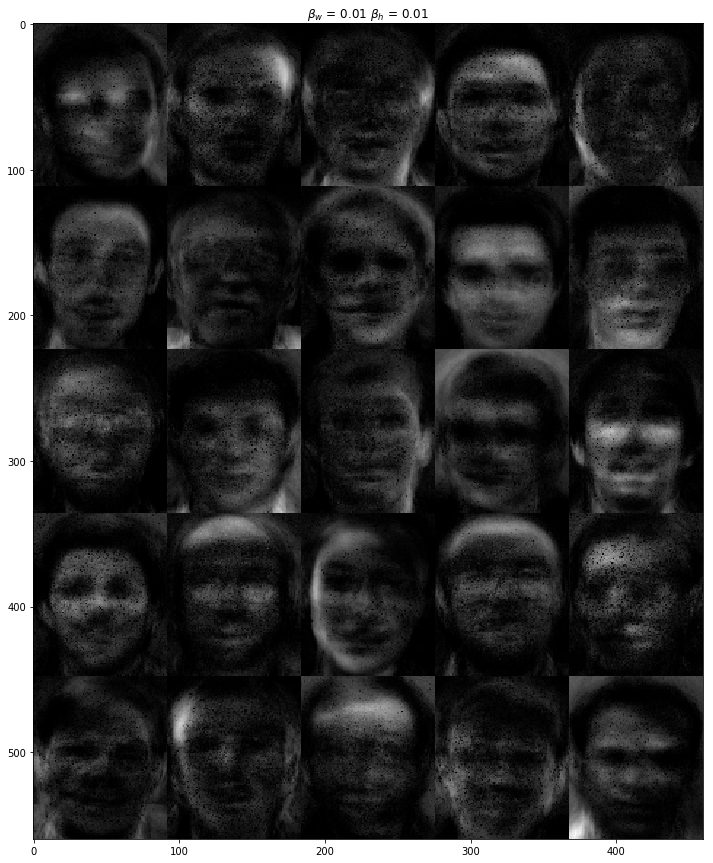

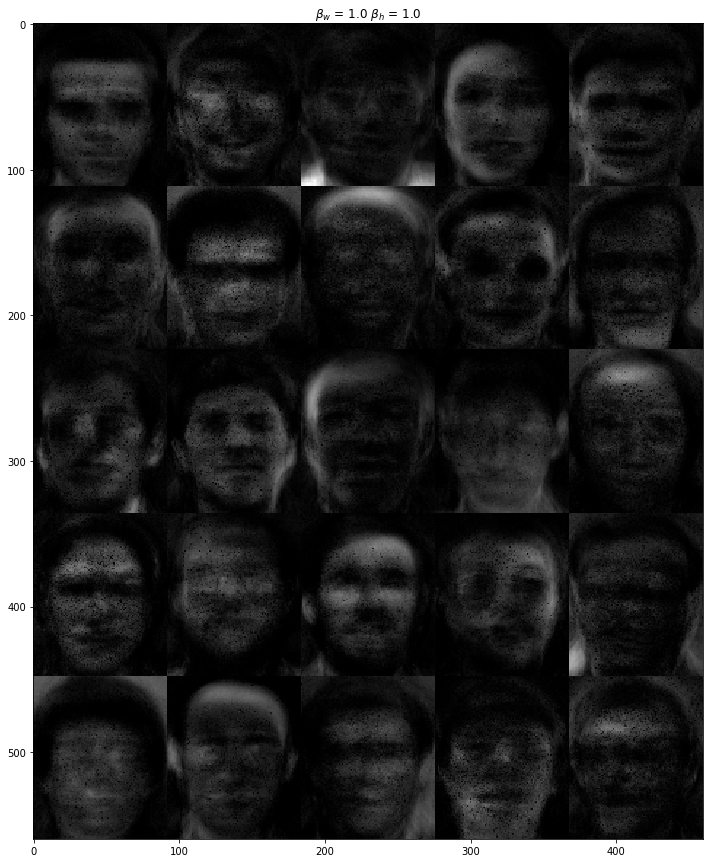

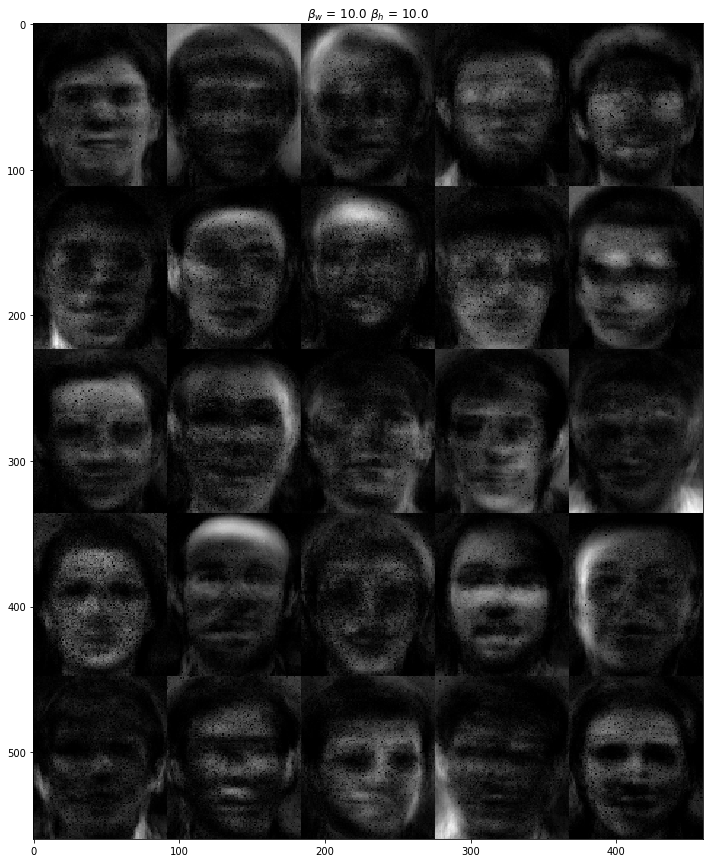

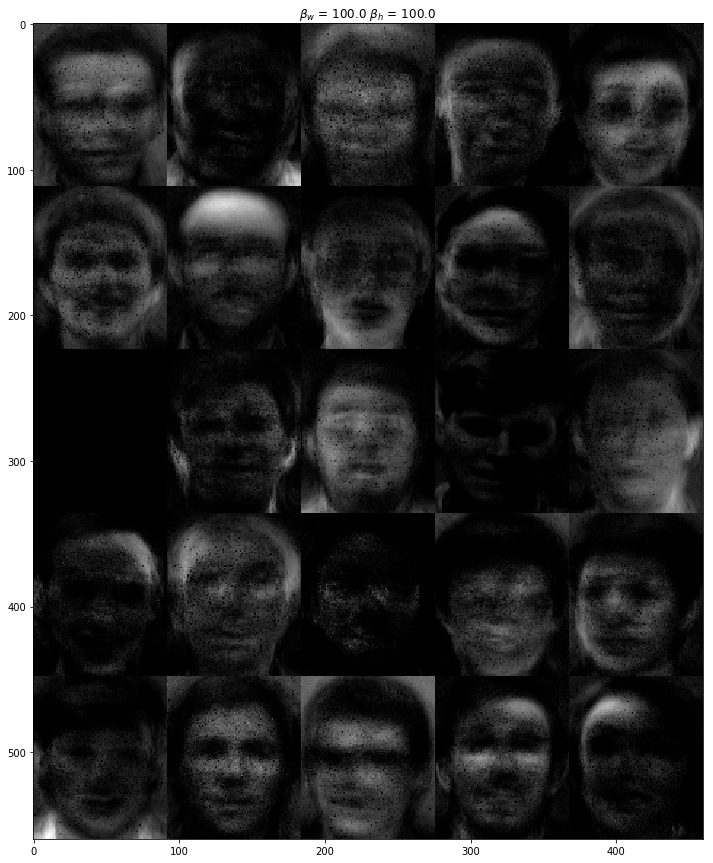

In [20]:
beta_w_values=np.array([0.01, 1, 10,100])
beta_h_values=np.array([0.01, 1, 10,100])
Params_change(data,beta_w_values, beta_h_values,beta=True, equal=True)

------------------------------------------------------------------------------------------

#### Case 1.2 : $\beta_w \ne \beta_h$

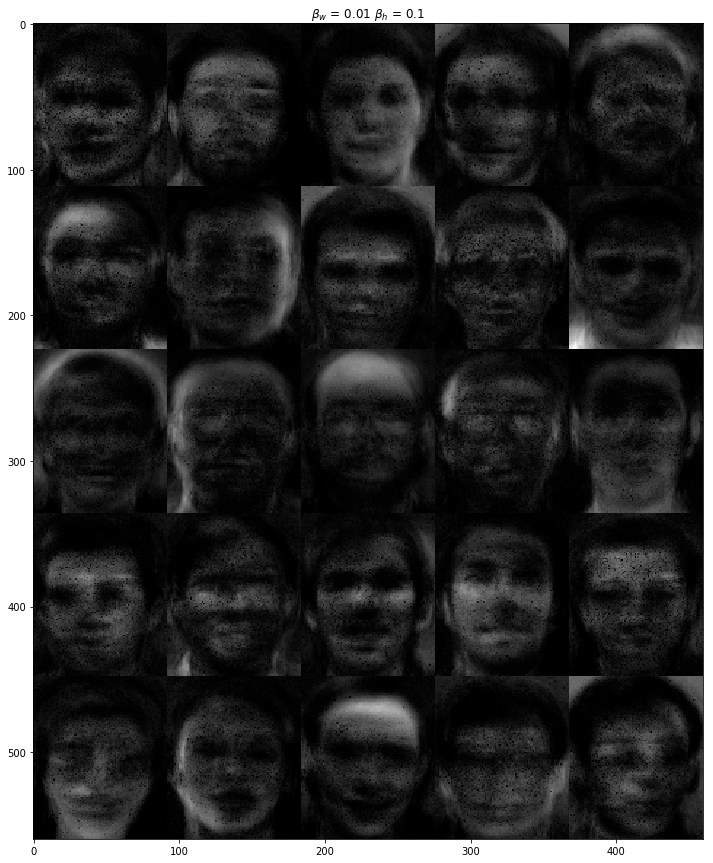

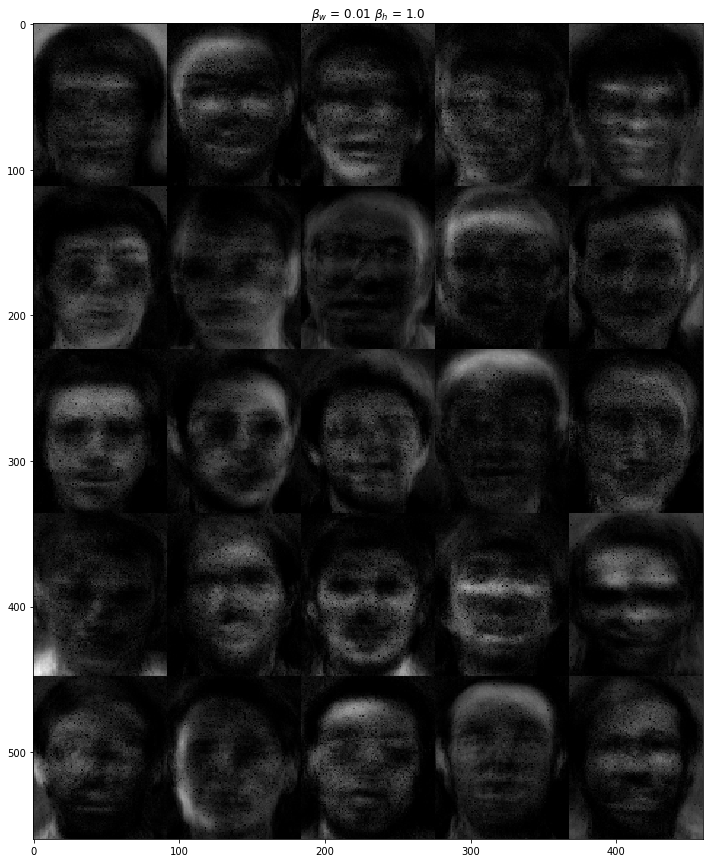

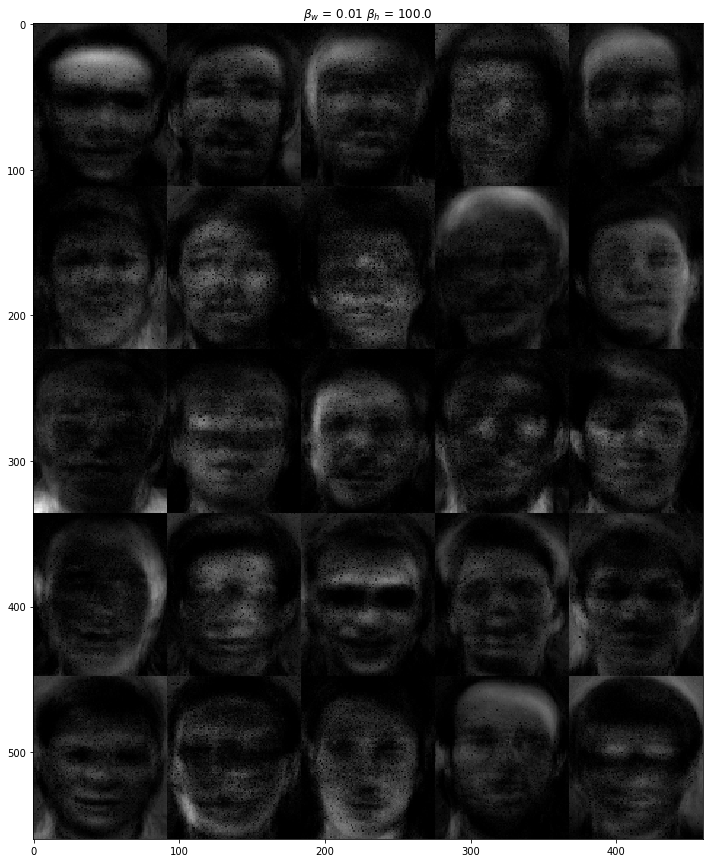

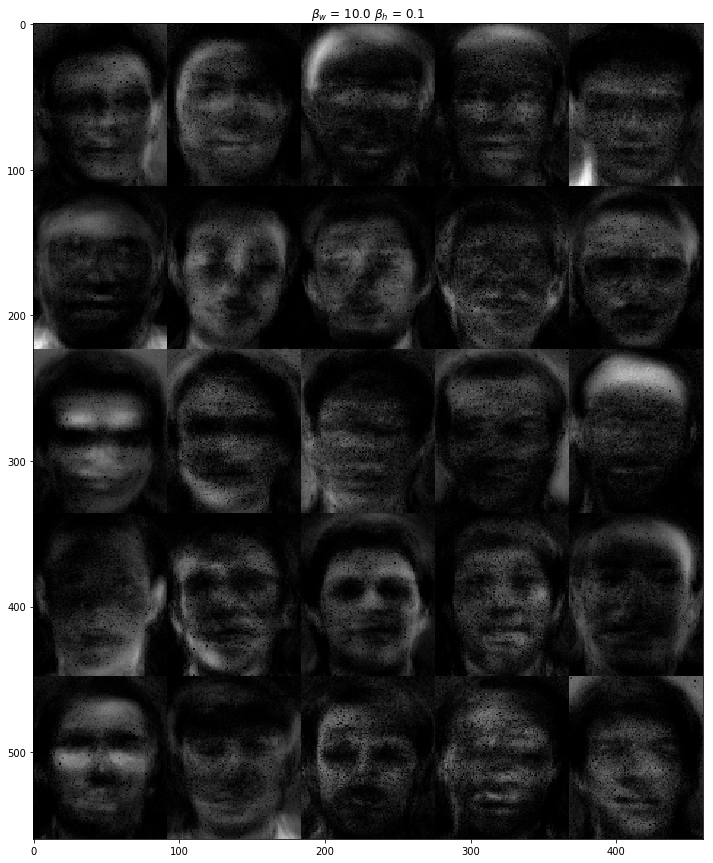

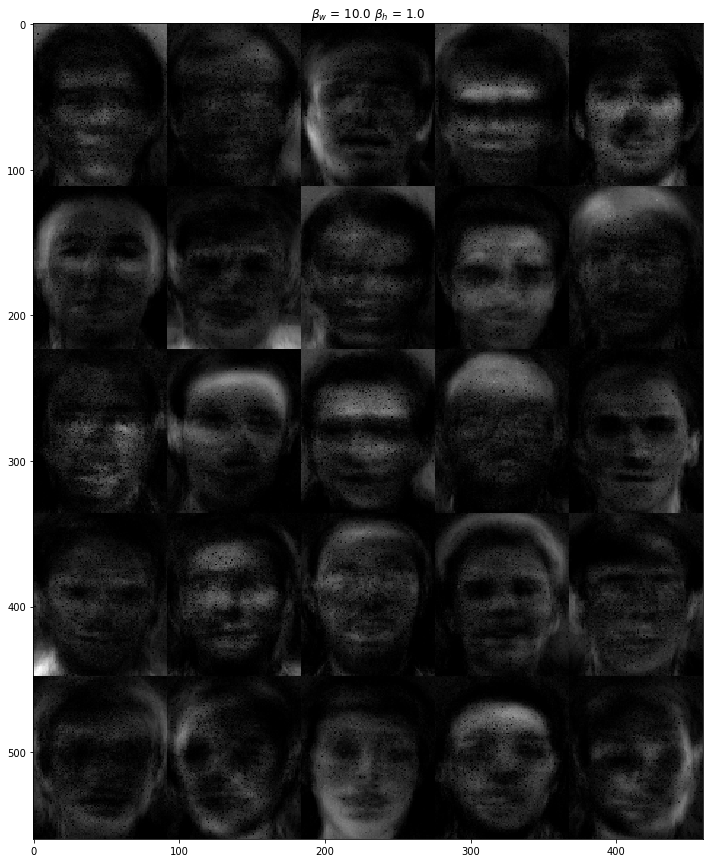

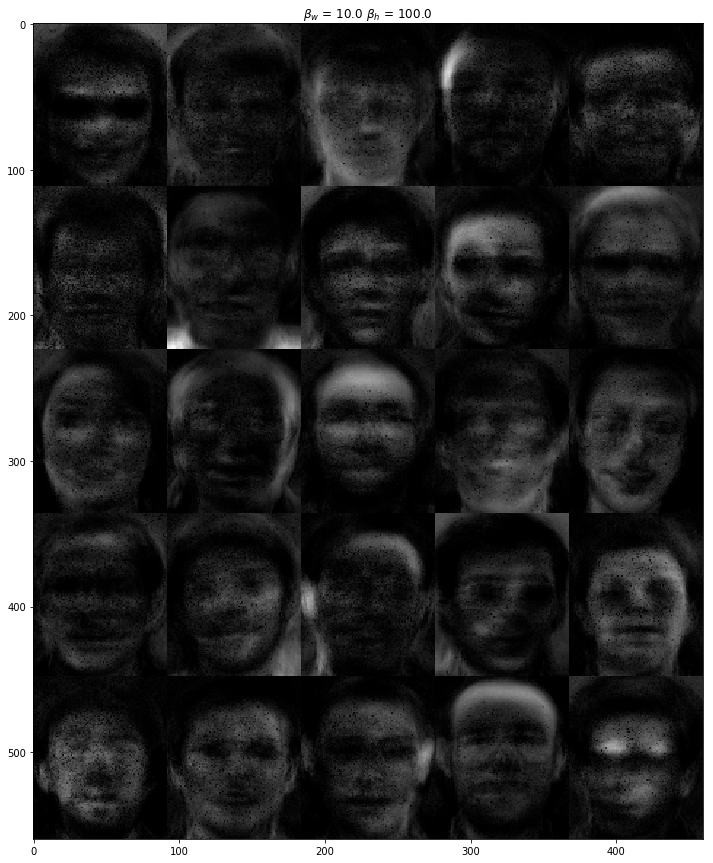

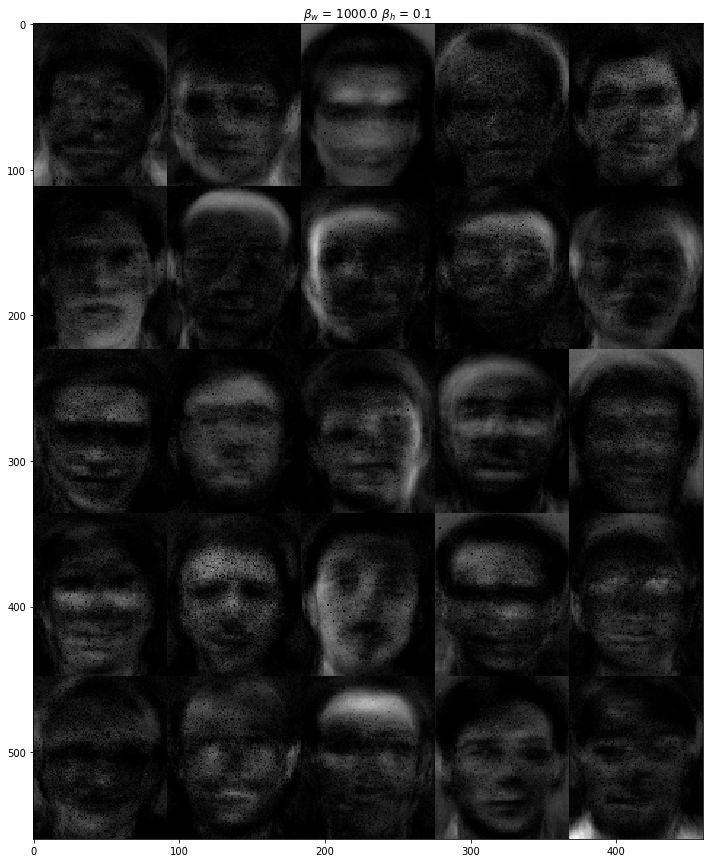

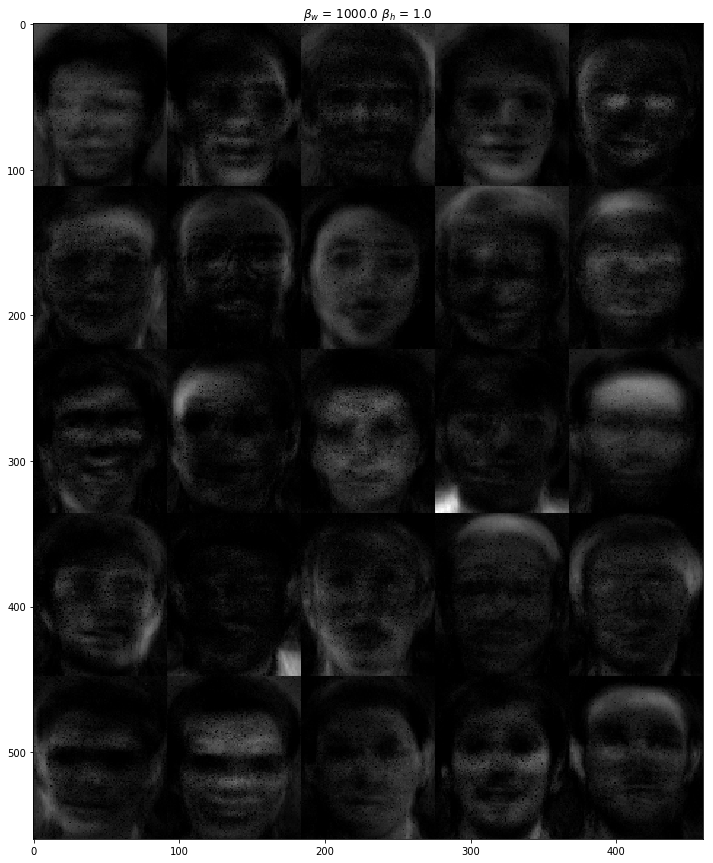

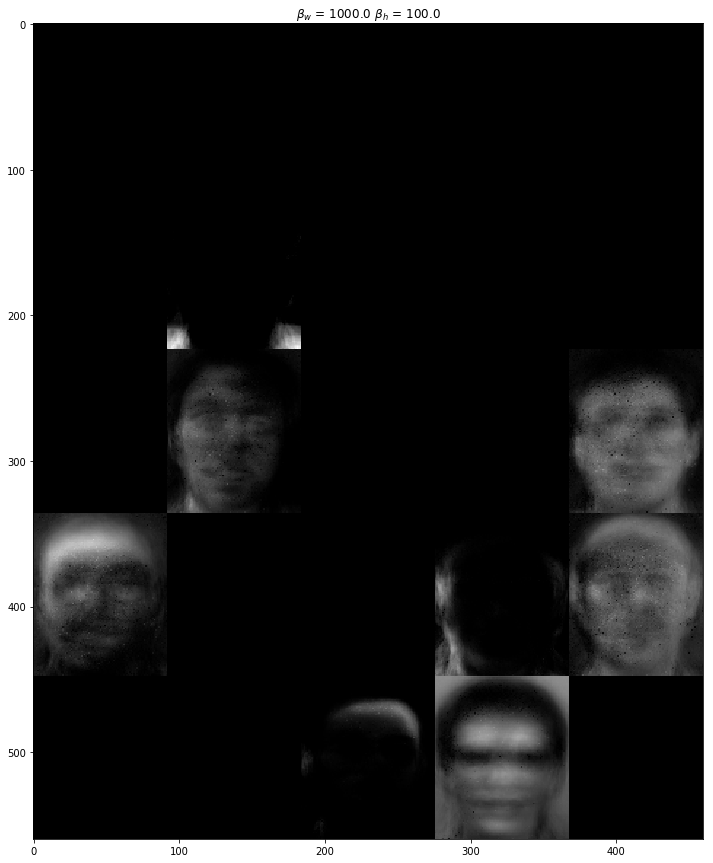

In [21]:
beta_w_values=np.array([0.01, 10, 1000])
beta_h_values=np.array([0.1, 1, 100])
Params_change(data,beta_w_values, beta_h_values,beta=True, equal=False)

### Interpretation : 



We will start the interpretation by commenting on the low values of $\beta_w$ and $\beta_h$. For this case, we see that the images we have got are not that clear, they are a bit blurred and fuzzy. Actually this can be explained by the fact that, when ever we have low values of $\beta_w$ and $\beta_h$, the matrices W and H are a bit dense. This will be shown in the following comments.

Now, for the high values of $\beta_w$ and $\beta_h$, we clearly see the face features ( in white ), such as the jaw, the nose, the eyes, the forehead etc... This is clear when we look at the images we have got for high values of $\beta_w$ and $\beta_h$, for example when both of them are equal to 100, and even when $\beta_w$  was equal to 10 and $\beta_h$ equal to 100.

We can also notice, that for VERY high values of $\beta_w$ and $\beta_h$, the images gets completly dark, and we can see noting. The increase of these values, makes both are matrices W and H sparse. This will be explained in the following paragraph.

We also notice, that the fact $\beta_w$ and $\beta_h$ are equal or different, doesnt affect that much of the results we get.


Here we will explain the fact that for high values of $\beta_w$ and $\beta_h$, the matrices W and H are sparse, and why they are dense for low values of $\beta_w$ and $\beta_h$.

Text(0.5, 1.0, 'The Gamma distribution')

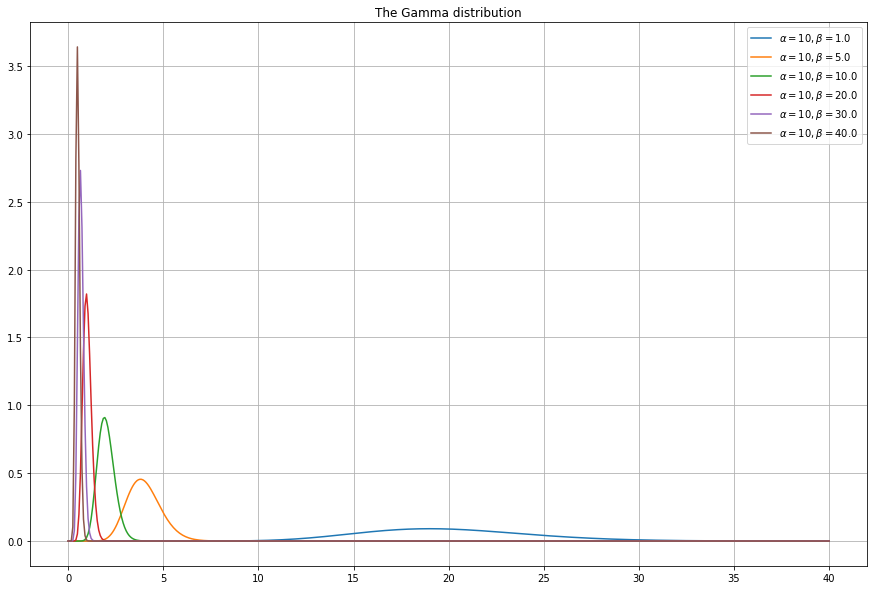

In [32]:
x = np.linspace (0, 40, 500)
plt.figure(figsize=(15,10))
betas_values=[1.,5.,10.,20., 30.,40.]

for beta in betas_values :
    distibution = stats.gamma.pdf(x, a = 20, scale = 1./beta)
    plt.plot(x, distibution, "-", label=(r'$\alpha=%s, \beta=$%s')%(10,beta)) 

plt.grid(True)
plt.legend()
plt.title(r"The Gamma distribution")

We clearly see that whenever $\beta$ is higher, the scale of the gamma distribution gets lower, and that's what explains the sparsity of both matrices W and H in the interpretation above. 

We can also interpret this by consediring the horizontal axis of the graph as the number of pixels we have in the image (256 in our case), we see that whenever $\beta$ is higher, the corresponding curve gets more centred in zero, which means that lots of the image pixels will have a null value, as we can see on both brown and purple curves above.

------------------------------------------------------------------------------------------

### Case 2 : Changing the $\alpha$ :  With $ K = 25 ;\beta_w = \beta_h =1 $



#### Case 2.1 : $\alpha_w = \alpha_h$

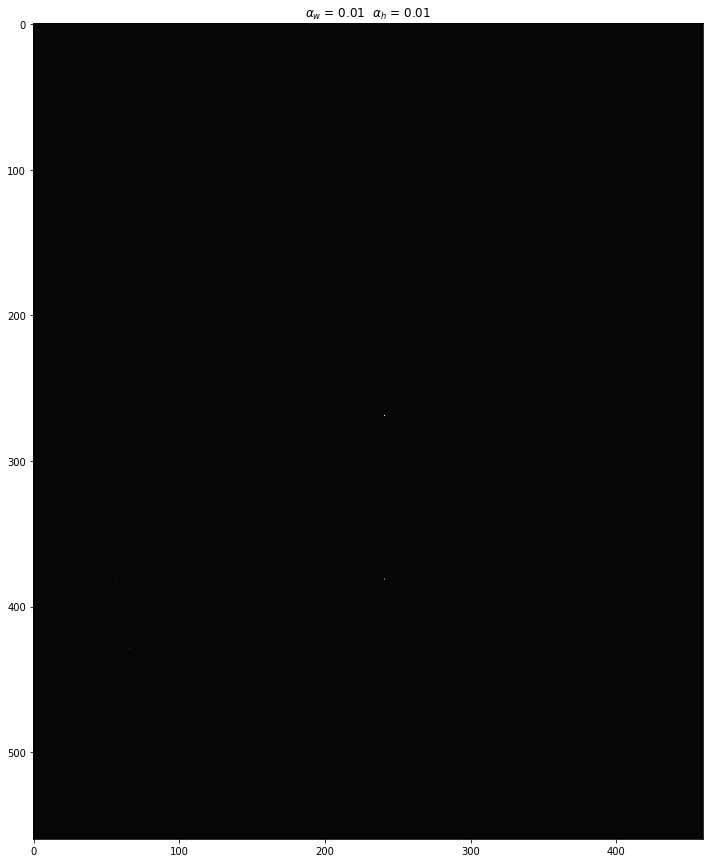

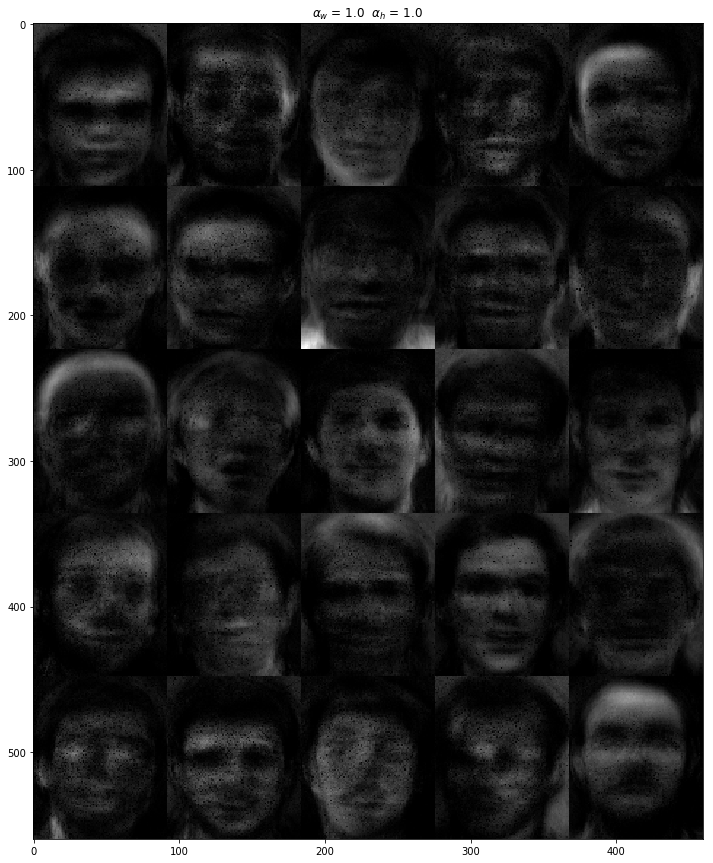

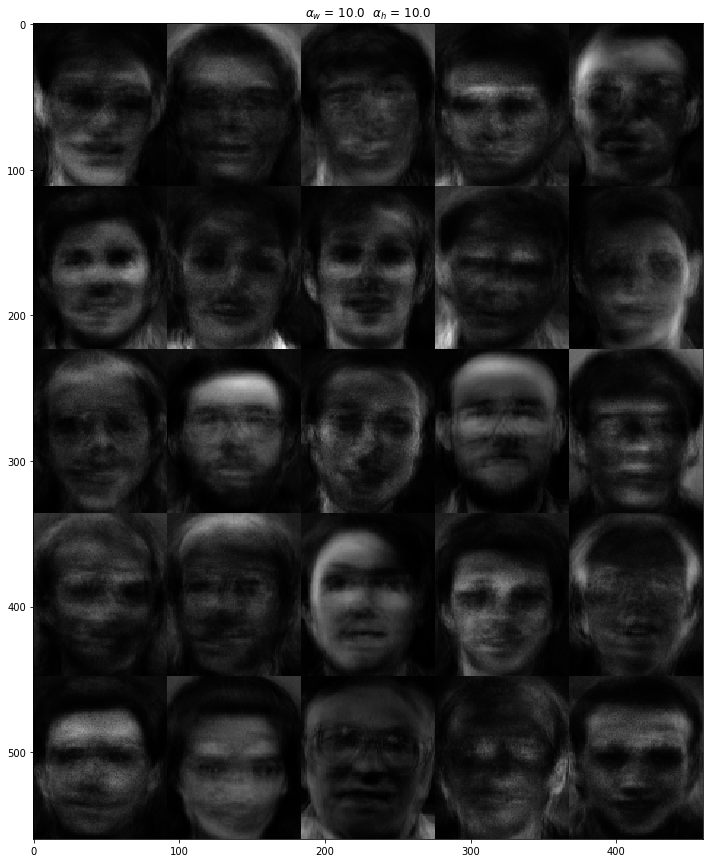

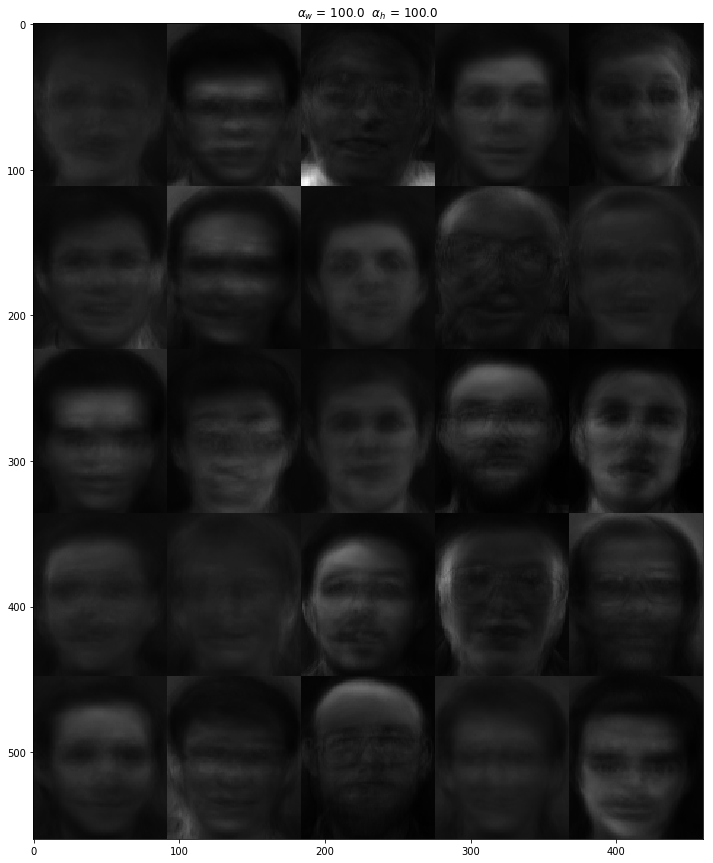

In [22]:
alpha_w_values=np.array([0.01, 1, 10,100])
alpha_h_values=np.array([0.01, 1, 10,100])
Params_change(data,alpha_w_values, alpha_h_values, alpha=True, equal=True)

------------------------------------------------------------------------------------------

#### Case 2.2 : $\alpha_w \ne \alpha_h$

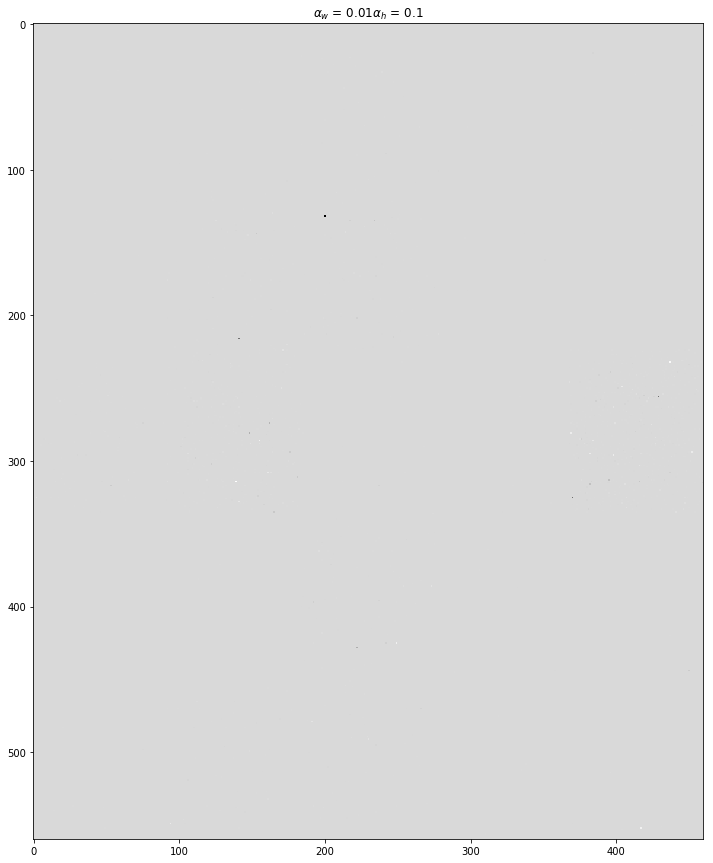

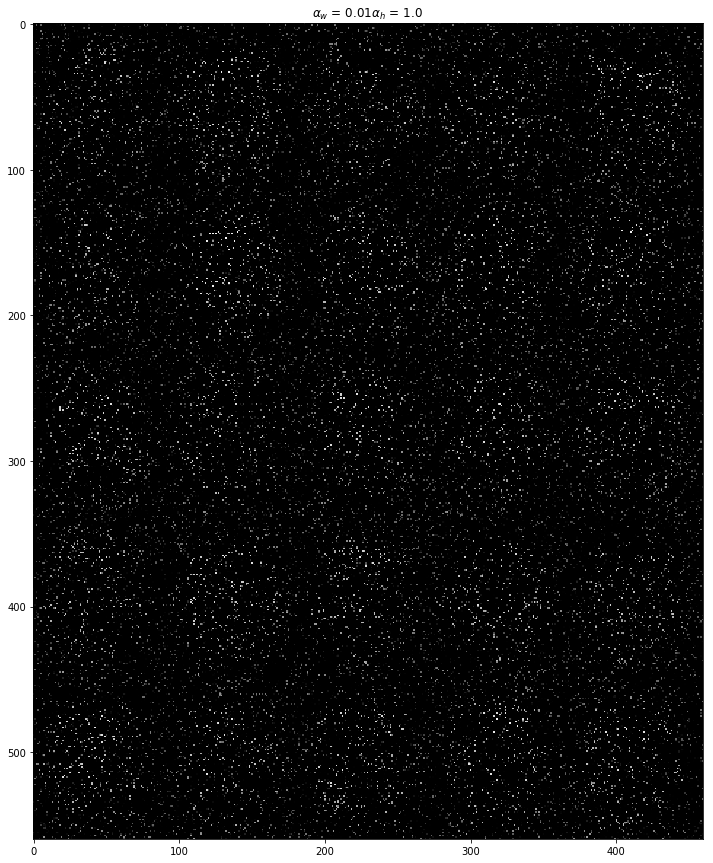

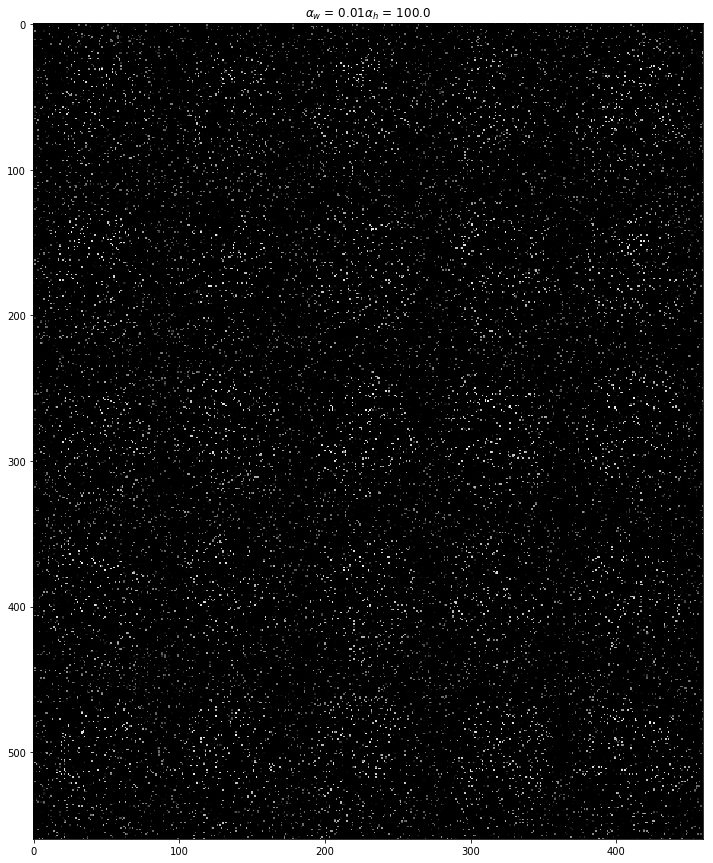

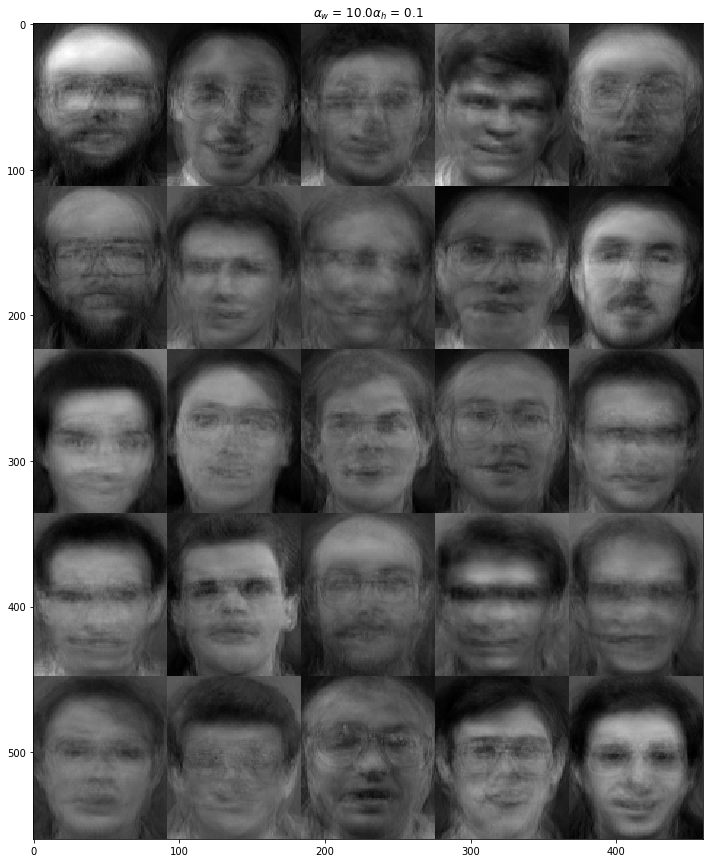

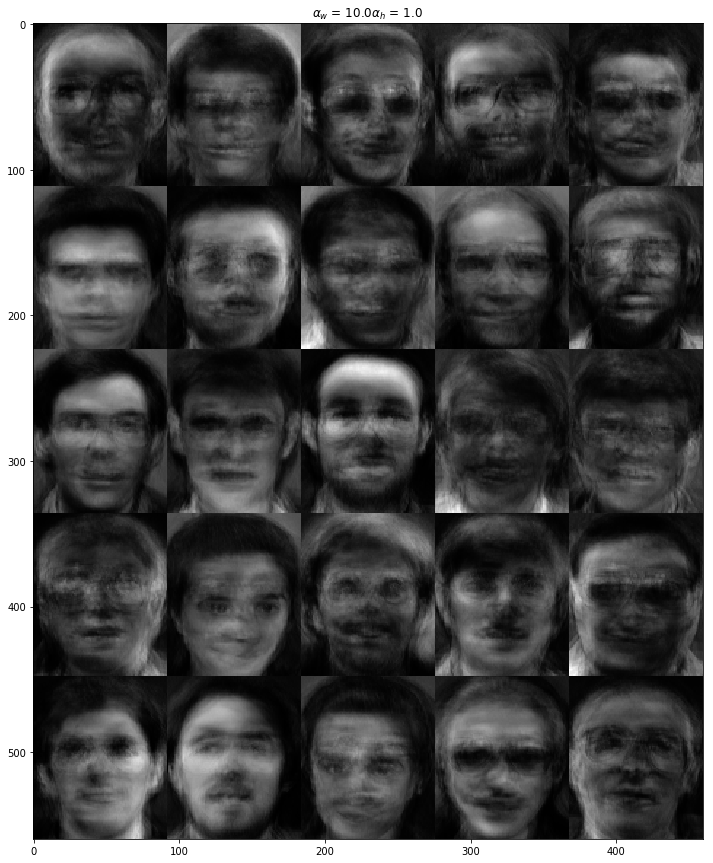

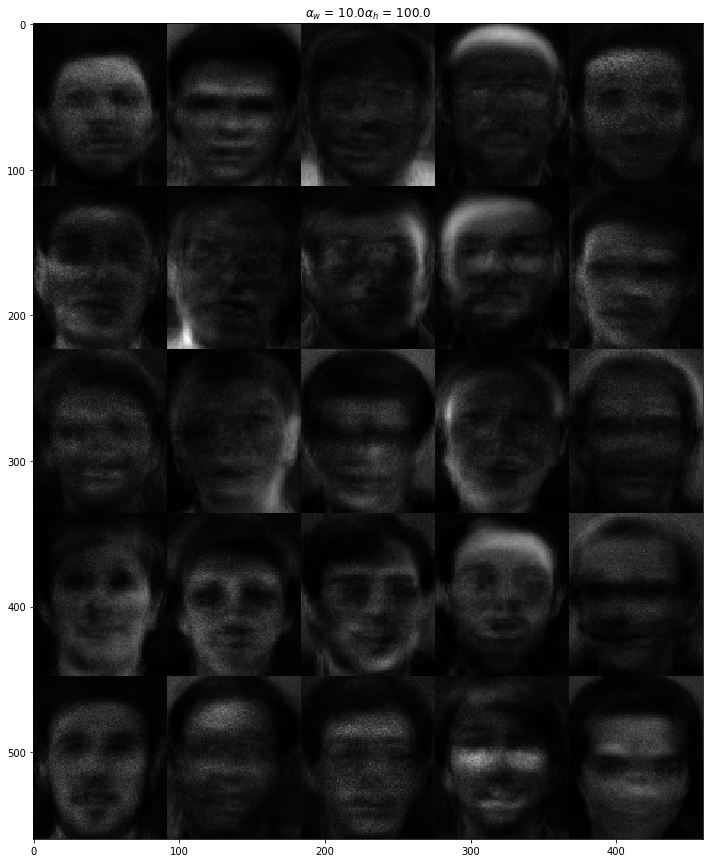

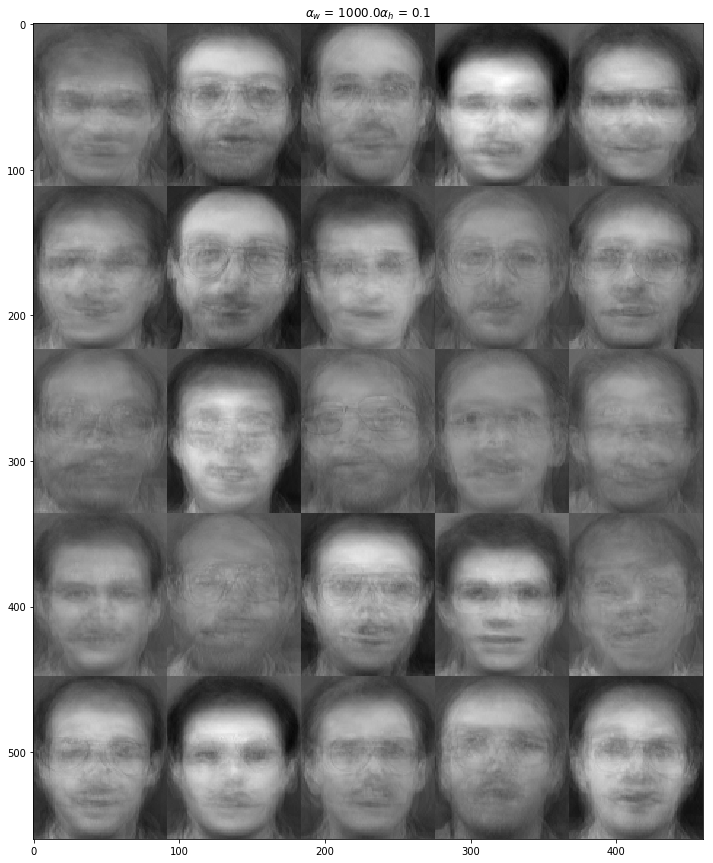

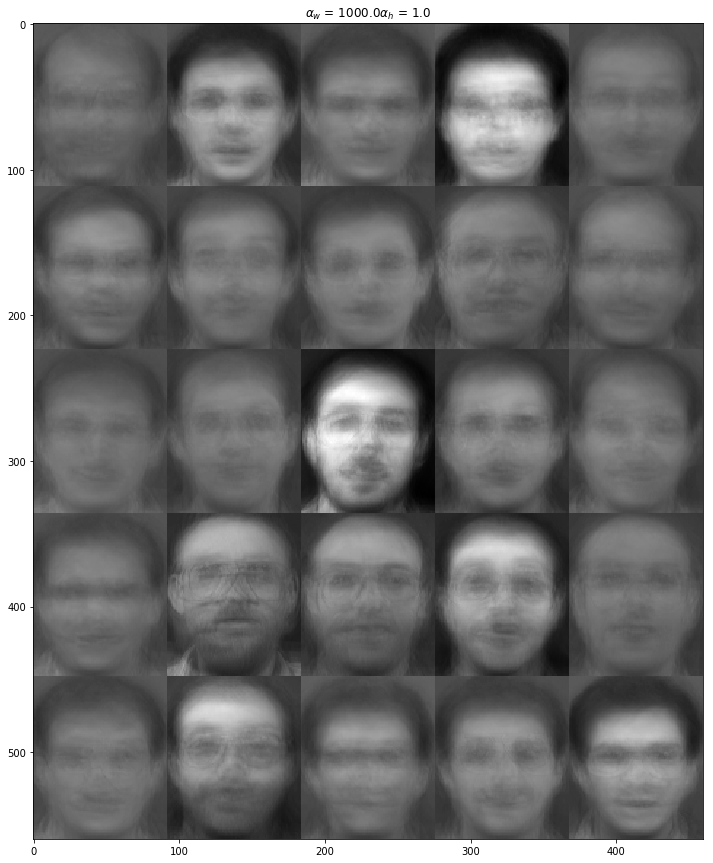

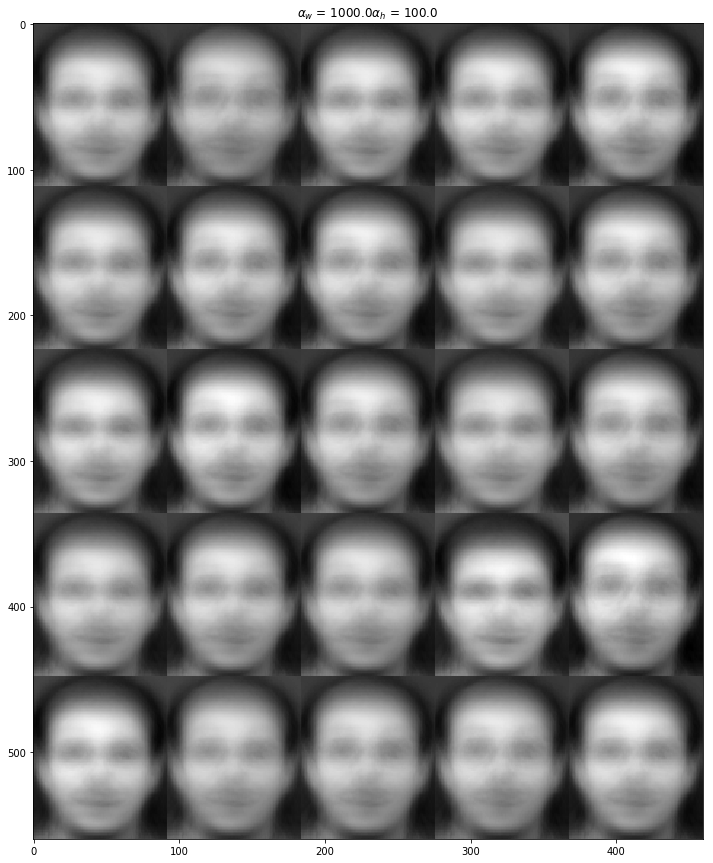

In [23]:
alpha_w_values=np.array([0.01, 10, 1000])
alpha_h_values=np.array([0.1, 1, 100])
Params_change(data,alpha_w_values, alpha_h_values,alpha=True, equal=False)

### Interpretation : 



We will start this interpretation by commenting on the low values of $\alpha_w$ and $\alpha_h$. Whenever both the values are low, we do not see anything.

Now for both $\alpha_w$ and $\alpha_h$ equal to 1, we start seeing some face features on the images. 

We also see that whenever $\alpha_w$ gets higher, the images we get tend to be more bright, on the other hand, when the value of $\alpha_h$ get's higher, the images gets darker, we can say that when the value of $\alpha_h$ gets higher, our matrix W gets sparser. 

------------------------------------------------------------------------------------------

### Case 3 : Changing the components value :


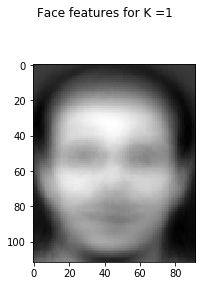

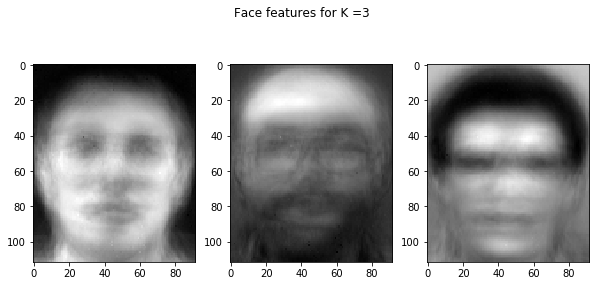

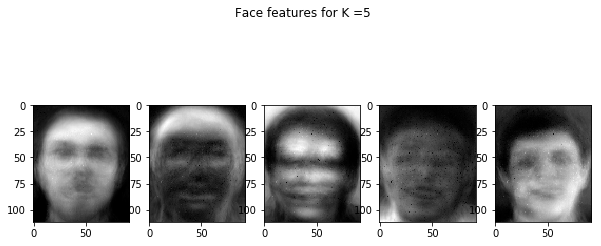

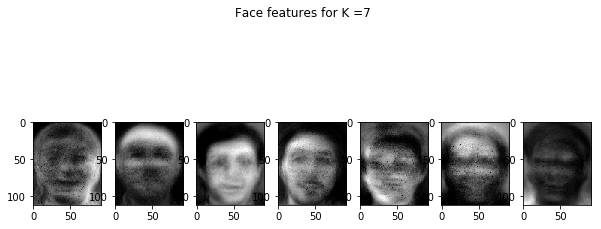

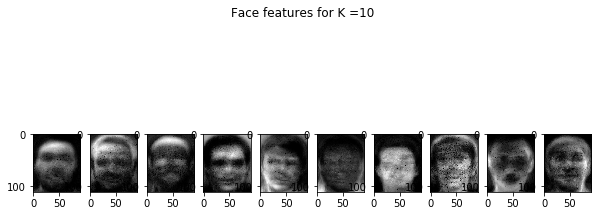

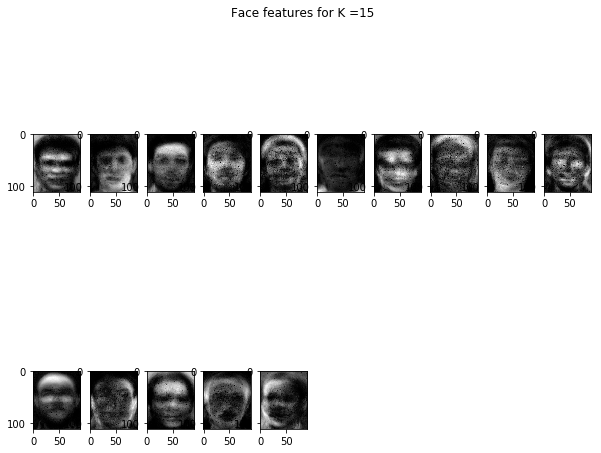

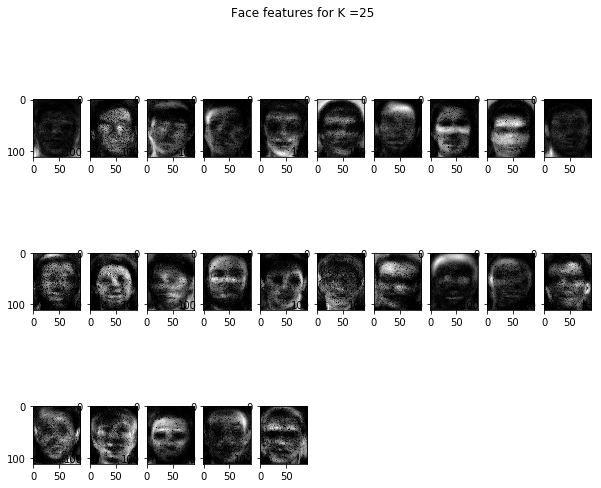

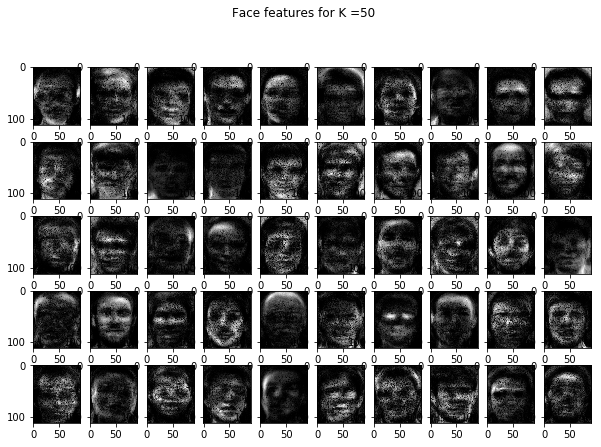

In [24]:
components = np.array([1,3,5,7,10,15,25,50])
Params_change(data,tab1=components, K=True)

### Interpretation : 



We clearly see that whenever we increase the value of K, we see more details of the face features. Actually, this is undrestandable by the fact that K represents the different face features in the matrix W, so when we increase, the more we will have face features, it's like we are having a zoom on more of the face details. This is very clear on the picture above, we can see that when K was low, the faces were more bright ( bright means that is it a highlighted feature), on the other hand, when K is high, we can see that the faces are darker, but the brightness becomes more concentrated on the face features. 

The choice of K results in a compromise between data fitting and model complexity.

- Data fitting : A greater K, leads to a better approximation.
- Model complexity : A smaller K leads to a less complex model.

Actually, this is because whenever we increase K, the model complexity increases because when K is high, both matrices W and H will have respectively more columns and more rows, and thus, it will be harder to estimate both of them. 

A right model order choice is important and it depends on the data V and on the application.

The following strategies are usually used to set up an appropriate model order:

- Choose model order K by trial and error / cross-validation.
- Estimate it automatically within the NMF decomposition ( see reference 4 for more details ).



------------------------------------------------------------------------------------------

## To go further with the project :

##### Why we use NMF ?

NMF is a versatile data decomposition technique that has proven effective for diverse applications across numerous disciplines, it tends to provide “meaningful” and “natural” part-based data representations.

Also, NMF is a non-supervised data decomposition technique that can be used for :

    - Feature learning, like PCA : 
Learn NMF on training dataset $V_{train} -> dictionary W$. Then exploit W to decompose new test examples $v_n$ :
$v_n = \sum_{k=1}^{K}h_{k,n}w_k$ ; $h_{k,n} > 0$, and use $h_n$ as feature vector for example n. <br>


    - Topics recovery : 
Topics described by most frequent words in each dictionnary element $w_k$. <br>


    - Clustering, like k-means : 
NMF can handle overlapping clusters and provides soft cluster membership indications. <br>


    - Temporal segmentation, like HMM :  
Analysing temporal data sequences, videos for example. Temporal segmentation can be achieved by thresholding the temporal activations relating to components of interest. <br>


    - Filtering and source separation : 
As with Independent Component Analysis (ICA). <br>


    - Coding : 
As with vector quantization. <br>


But the main problems with NMF and what needs to be known is :
- How to achieve better and faster “convergence”?
- How to properly estimate the model-order K?
- How to handle big data?

------------------------------------------------------------------------------------------

<a id='ref'></a>
## References :

[1] Ferdinando S Samaria and Andy C Harter, “Parameterisation of a stochastic model for human face identification,”in Applications of Computer Vision, 1994., Proceedings of the Second IEEE Workshop on. IEEE, 1994, pp. 138–142.

[2] Ali Taylan Cemgil, “Bayesian inference for nonnegative matrix factorisation models,” Computational Intelligence
and Neuroscience, vol. 2009, 2009.

[3] Introduction to Nonnegative Matrix Factorisation, Slim ESSID, Telecom ParisTech, June 2018.

[4] Tan and Févotte, 2013; Schmidt and Morup, 2010.